# Precio de casas - Dataset Ames

## Descripción de la competencia

Pregúntale a un comprador acerca de la casa de sus sueños y ellos probablemente no empezarán hablando acerca de la altura del techo del sótano o de la accesibilidad al transporte. No obstante, este conjunto de datos prueba que hay muchas más variables que afectan las negociaciones del precio que solamente el número de cuartos o si tiene una cerca blanca.

Con 79 variables explicatorias que describen (casi) cada aspecto de las casas resienciales en Ames, Iowa, el propósito de esta competencia es predecir el precio final de cada casa.

### Objetivo
Nuestro objetivo es predecir el precio de ventas de cada casa. Para cada Id en el conjunto de prueba, debemos predecir el valor de la variable `SalePrice`.

> A día de hoy, el puesto 1000 tiene una puntuación de 0.13028, así que nuestro objetivo será superarlo.

### Métrica
Las entregas serán evaluadas usando el RMSE (Root-Mean-Squared-Error) entre el logaritmo del valor predicho y el logaritmo de los precios de venta observados. (Tomar los logaritmos significa que los errores en predecir casas costosas y baratas afectará el resultado de manera equitativa.)

### Formato de entrega
Cada archivo debe contener una cabecera y debe tener el siguiente formato:

`
Id,SalePrice
1461,169000.1
1462,187724.1233
1463,175221
etc.
`

### Descripción de los datos

La descripción de los datos se encuentra en el archivo `data_description.txt` y no se pondrán explícitamente aquí.
Los datos con los que trabajaremos se encuentran como `train.csv` y `test.csv`.

> Columna objetivo: `SalePrice`

## Bibliotecas de Python que se usarán
Comencemos cargando las bibliotecas que vamos a usar

In [463]:
#Bibliotecas básicas
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
#Biblioteca que genera un reporte para el EDA
import sweetviz
#Biblioteca para visualizar datos faltantes
import missingno as msno

#Biblioteca para las advertencias
import warnings

from sklearn.decomposition import PCA
#Biblioteca para obtener la información mutua entre las características
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression

#Biblioteca para hacer una validación cruzada
from sklearn.model_selection import cross_val_score

#Bibliotecas relacionadas con las transformaciones de columnas
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.preprocessing import StandardScaler
from category_encoders import MEstimateEncoder

#Bibliotecas para el modelamiento, recordemos que el problema es uno de regresión.
from  sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

#Gatitos
from catboost import CatBoostRegressor, CatBoost
from catboost import Pool, cv

#Biblioteca para hacer la agrupación por las k-medias
from sklearn.cluster import KMeans

Adicionalmente carguemos algunas funciones que nos pueden ser útiles y que no he encontrado en alguna biblioteca

In [5]:
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)


def apply_pca(X, standardize=True):
    # Standardize
    if standardize:
        X = (X - X.mean(axis=0)) / X.std(axis=0)
    # Create principal components
    pca = PCA()
    X_pca = pca.fit_transform(X)
    # Convert to dataframe
    component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)
    # Create loadings
    loadings = pd.DataFrame(
        pca.components_.T,  # transpose the matrix of loadings
        columns=component_names,  # so the columns are the principal components
        index=X.columns,  # and the rows are the original features
    )
    return pca, X_pca, loadings


def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs


def make_mi_scores_classification(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def make_mi_scores_regression(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def plot_mi_scores(scores):
    plt.figure(dpi=100,figsize=(10,10))
    scores=scores.sort_values(ascending=True)
    width= np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width,scores)
    plt.yticks(width,ticks)
    plt.title("Mutual Information Scores");
    

def plot_pca_box_diagram(X_pca):
    sns.catplot(
      y='value',
      col='variable',
      data=X_pca.melt(),
      kind='boxen',
      sharey=False,
      col_wrap=2
    );

def eliminar_valores_atipicos_pca(train,num):
  """
  Train: Conjunto de entrenamiento, incluye la variable objetivo
  num:Número de valores extremos que se tomará para cada componente principal por arriba y por debajo
  """
  X=train.copy()
  num_features=list(X.select_dtypes("float64").columns)
  def encontrar_valores_atipicos_por_componente(X,X_pca,component, num):
    idx=X_pca[component].sort_values(ascending=False).index
    X_aux=X.copy()
    X_aux.set_index(idx, inplace=True)
    return (X_aux.head(num), X_aux.tail(num))
  lista_va_sup=list()
  lista_va_inf=list()
  _, X_pca, _ = apply_pca(X[num_features], standardize=True)
  plot_pca_box_diagram(X_pca)
  for pc in list(X_pca.columns):
    va=encontrar_valores_atipicos_por_componente(X,X_pca,pc,num)
    lista_va_sup.append(va[0])
    lista_va_inf.append(va[1])
  valores_atipicos=pd.concat(lista_va_sup+lista_va_inf).reset_index().drop_duplicates(subset='index').set_index('index')
  return train.reset_index().drop(list(valores_atipicos.index),axis=0).set_index('index')

## Experimento 1

### 1.1 Carga de datos
Como siempre, para comenzar, carguemos los datos:

In [6]:
#Vamos a definir una función para cargar los datos, puede sernos útil si queremos volver a cargar los datos más adelante
def loadData(train_path,test_path):
     return (pd.read_csv(train_path),pd.read_csv(test_path))
train ,test = loadData('train.csv','test.csv') 

Veamos qué contienen estos datos:

In [7]:
train.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


Al ser tantas las columnas, no podemos visualizarla de manera adecuada con head. Visualicémosla con info:

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

Tenemos dos datasets de tamaños similares: 1460 entradas para `train.csv` y 1459 para `test.csv`. 

### 1.2 Datos faltantes

Observamos que hay varias columnas con muchos valores nulos, como lo son `Alley`, `FireplaceQu`, `PoolQC`, `Fence` y `MiscFeature`. En la gran mayoría no hay falta de datos y cuando la hay es poca. Visualicemos primero la cantidad de datos faltantes:

<Figure size 576x288 with 0 Axes>

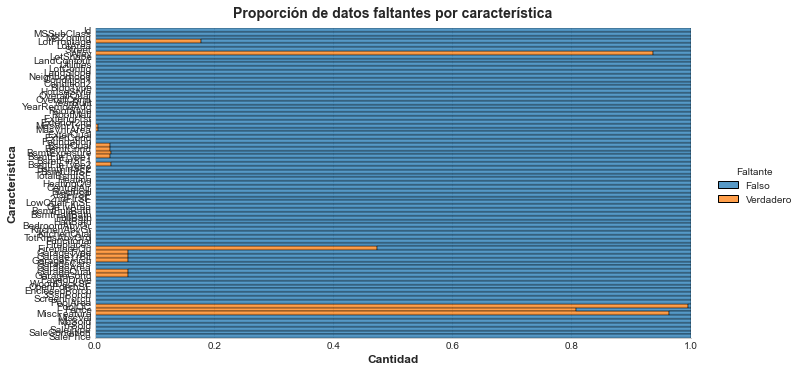

In [11]:
def graficar_proporcion_faltantes(df,title,xlabel,ylabel):
    plt.figure(figsize=(8,4));
    f=sns.displot(
        data=df.isna().apply(lambda col: col.apply(lambda val: 'Verdadero' if val else 'Falso')).melt(value_name="Faltante"),
        y="variable",
        hue="Faltante",
        multiple="fill",
        aspect=2
    )
    plt.title(title);
    plt.xlabel(xlabel);
    plt.ylabel(ylabel);
    return f
graficar_proporcion_faltantes(train,'Proporción de datos faltantes por característica','Cantidad','Característica');

Ahora veamos su distribución:

D:\DataScience\Spacial_titanic_project\env\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


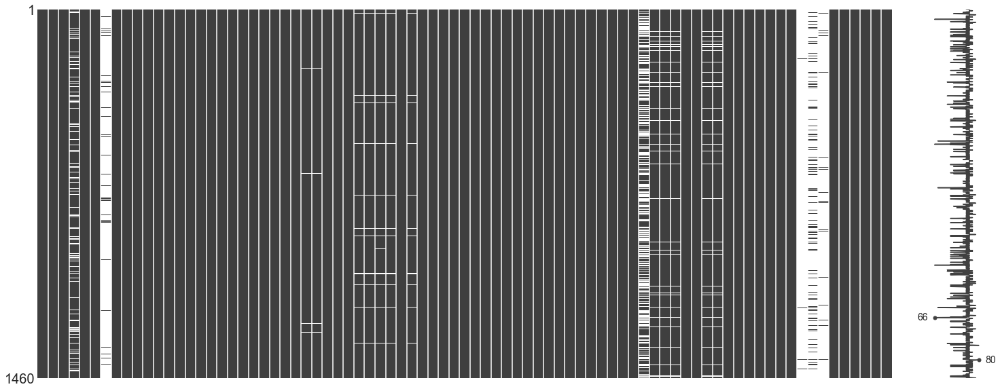

In [12]:
msno.matrix(train)
plt.show()

Podemos observar que hay patrones en la gráfica anterior, así que podremos asociar algunas columnas al momento de intentar hacer la imputación o de decir algo acerca de ellas. La asociación sería la siguiente:
* `LotFrontage` (259 / 18%) solo
* `Alley`  (1369 / 94%) solo
* `MasVnrType` (8 / <1%) con `MasVnrArea`(8 / <1%)
* `BsmtQual` (37 / 3%), `BsmtCond` (37 / 3%), `BsmtExposure` (38 / 3%),`BsmtFinType1` (37 / 3%), `BsmtFinType2` (38 / 3%) - Falta revisar si `BsmtExposure` y `BsmtFinType2` tienen exactamente las mismas columnas faltantes.
* `Electrical` (1 / <1%) solo
* `FireplaceQu` (690 /47%) solo
* `GarageType`, `GarageYrBlt`, `GarageFinish`, `GarageQual` y `GarageCond` todos con (81 / 6%)
* `PoolQC` (1453 / > 99%) solo
* `Fence` (1179 / 81%) solo
* `MiscFeature` (1406 / 96%) solo

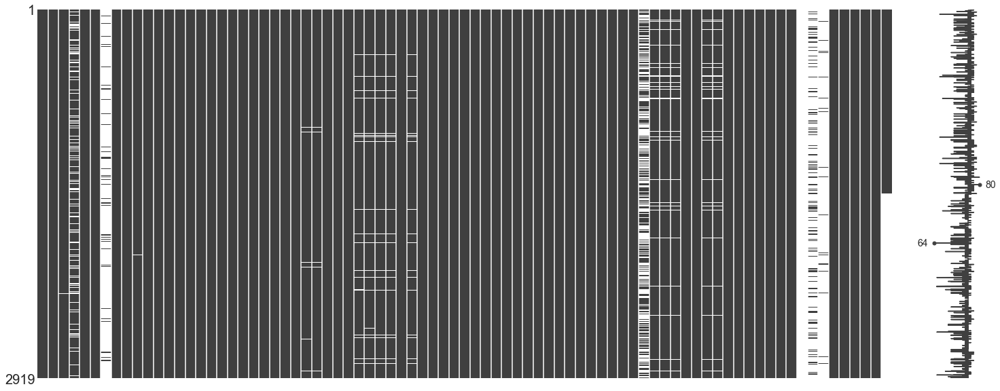

In [13]:
msno.matrix(pd.concat([train,test]))
plt.show()

Cabe notar que en `test` también hay datos faltantes donde los hay en `train`, y que el patrón se conserva casi de la misma forma. Si analizamos el documento de las descripciones notaremos algo interesante.
Por ejemplo nos dice que `Alley` (Callejón) puede tener como valor NA, con el significado de no haber acceso por callejones a la propiedad. En este caso lo mejor es llenar los valores con 'NA'. Lo mismo sucede con `BsmtQual`,`BsmtCond`, `BsmtExposure`, `BsmtFinType1` y `BsmtFinType2`, aunque hay que tener cuidado porque hay algunos datos que no pertenecen a este tipo, por lo que si alguna de las características anteriores no es NA, significa que las otras tampoco lo son. También podemos tener en cuenta las demás características relacionadas con los sótanos, por ejemplo `TotalBsmtSF`. 
Para `FireplaceQu` también sucede lo mismo, hay un valor preciso para NA y podemos observar que los datos faltantes son exactamente el mismo número de en los que `Fireplaces` tiene como número de chimeneas 0. Con los datos relacionados al garaje sucede lo mismo que con los del sótano.
Los datos de `PoolQc` se pueden llenar tranquilamente con `NA`, pues significa que esa casa no tiene piscina. El número de datos con NA, en este caso, también coincide con el número de datos que tienen 0 pies cuadrados de piscina.
Lo mismo sucede para `Fence` y para `MiscFeature`.

#### 1.2.1 Función para llenar los valores faltantes

In [14]:
def llenarNA(dataframe):
    df=dataframe.copy()
    df.Alley.fillna('NA',inplace=True)
    mascaraBsmt= (df[['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']].isna().all(axis=1) & (df.TotalBsmtSF==0))
    df.BsmtQual.mask(mascaraBsmt,'NA', inplace=True)
    df.BsmtCond.mask(mascaraBsmt,'NA', inplace=True)
    df.BsmtExposure.mask(mascaraBsmt,'NA', inplace=True)
    df.BsmtFinType1.mask(mascaraBsmt,'NA', inplace=True)
    df.BsmtFinType2.mask(mascaraBsmt,'NA', inplace=True)
    mascaraFireplace=df.FireplaceQu.isna() & (df.Fireplaces==0)
    df.FireplaceQu.mask(mascaraFireplace,'NA', inplace=True)
    mascaraPool=df.PoolQC.isna() & (df.PoolArea==0)
    df.PoolQC.mask(mascaraPool,'NA', inplace=True)
    mascaraGarage=df[['GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual','GarageCond']].isna().all(axis=1) & (df.GarageArea ==0)
    df.GarageType.mask(mascaraGarage,'NA',inplace=True)
    df.GarageYrBlt.mask(mascaraGarage,df.YearBuilt,inplace=True)
    df.GarageFinish.mask(mascaraGarage,'NA',inplace=True)
    df.GarageQual.mask(mascaraGarage,'NA',inplace=True)
    df.GarageCond.mask(mascaraGarage,'NA',inplace=True)
    df.Fence.fillna('NA',inplace=True)
    mascaraMisc=df.MiscFeature.isna() & (df.MiscVal==0)
    df.MiscFeature.mask(mascaraMisc,'None',inplace=True)
    return df    

D:\DataScience\Spacial_titanic_project\env\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


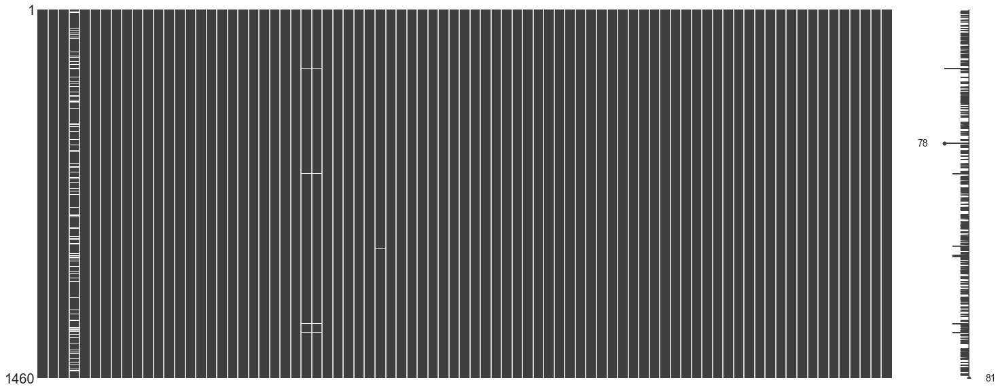

In [15]:
train_clean=llenarNA(train)
test_clean=llenarNA(test)

#train_clean.MiscFeature.unique()
msno.matrix(train_clean)
plt.show() 


¡Mucho mejor! Aunque todavía tenemos el problema de algunos datos faltantes aislados y de `LotFrontage`.  Antes de ver qué hacer con SweetViz, analicemos el conjunto de datos con SweetViz, que nos dará un resumen  y en particular, nos dirá cuales características están más asociadas a `LotFrontage`.

#### 1.2.2 Análisis de la característica `LotFrontage`

                                             |                                             | [  0%]   00:00 ->…

Report Reporte1_precios_casa.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



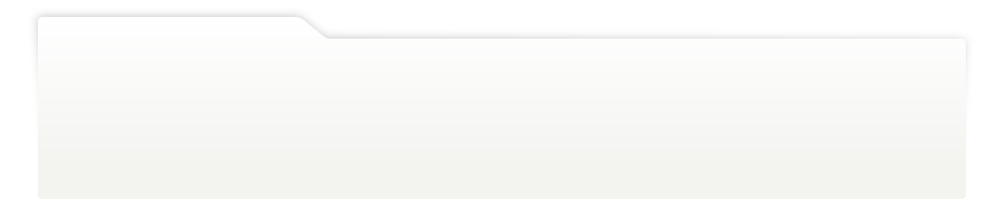
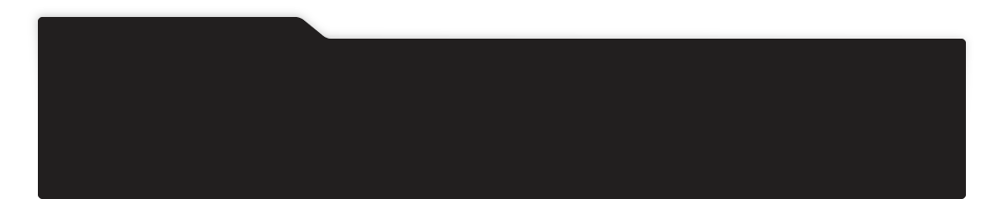
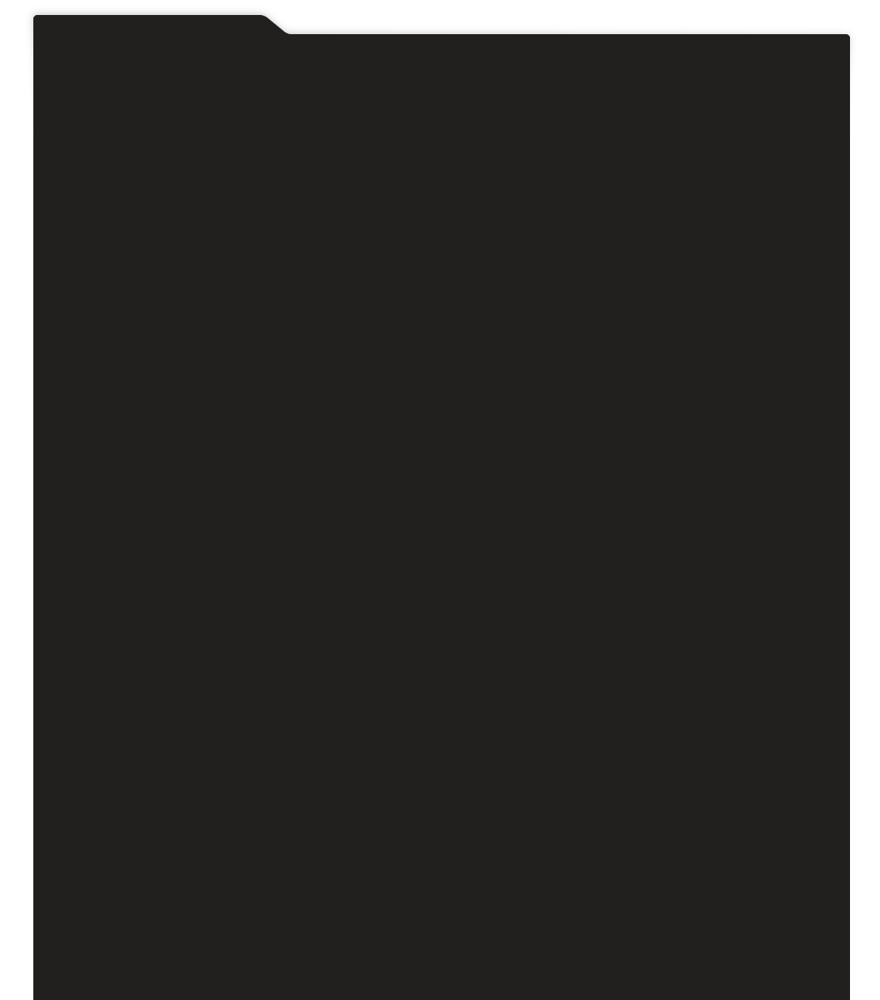
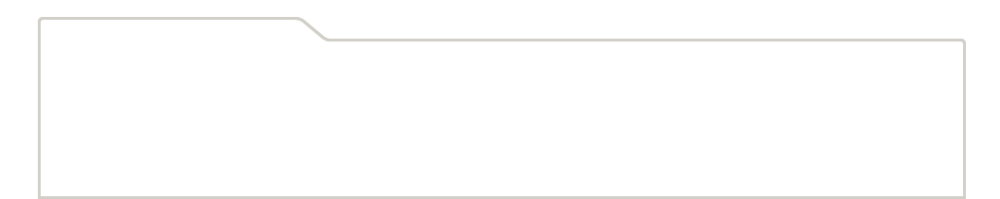
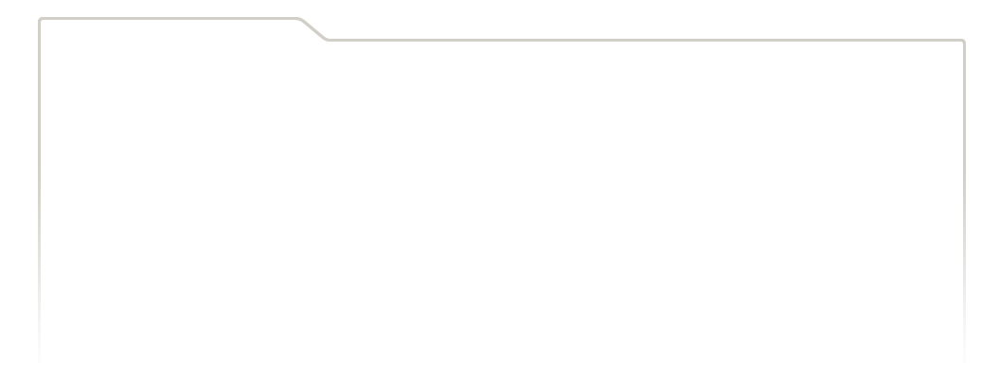
...
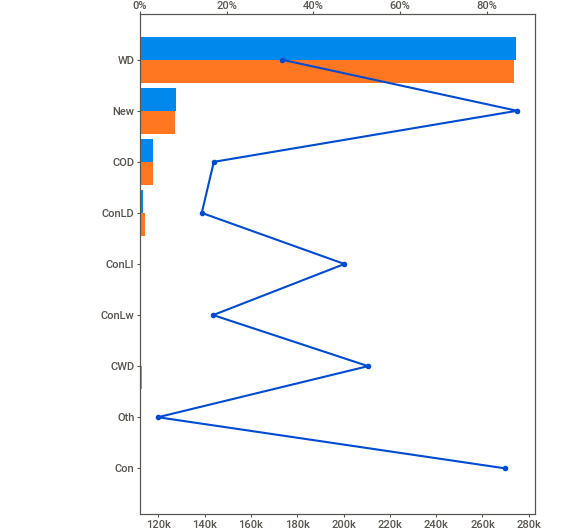
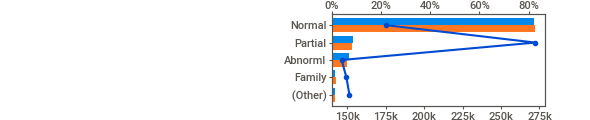
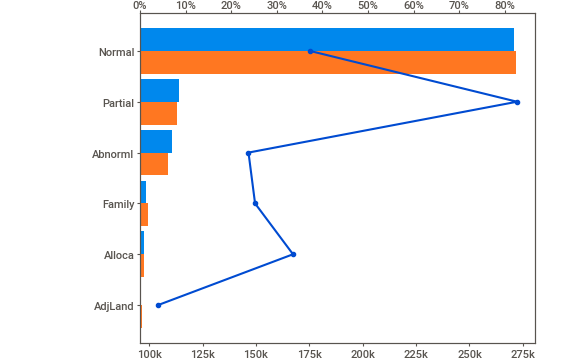
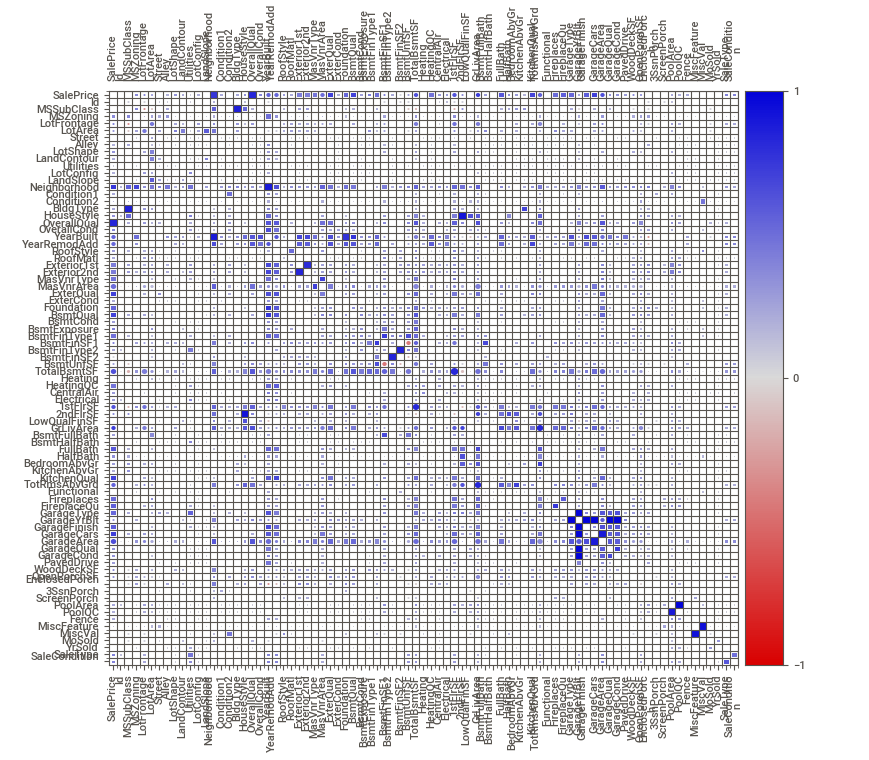
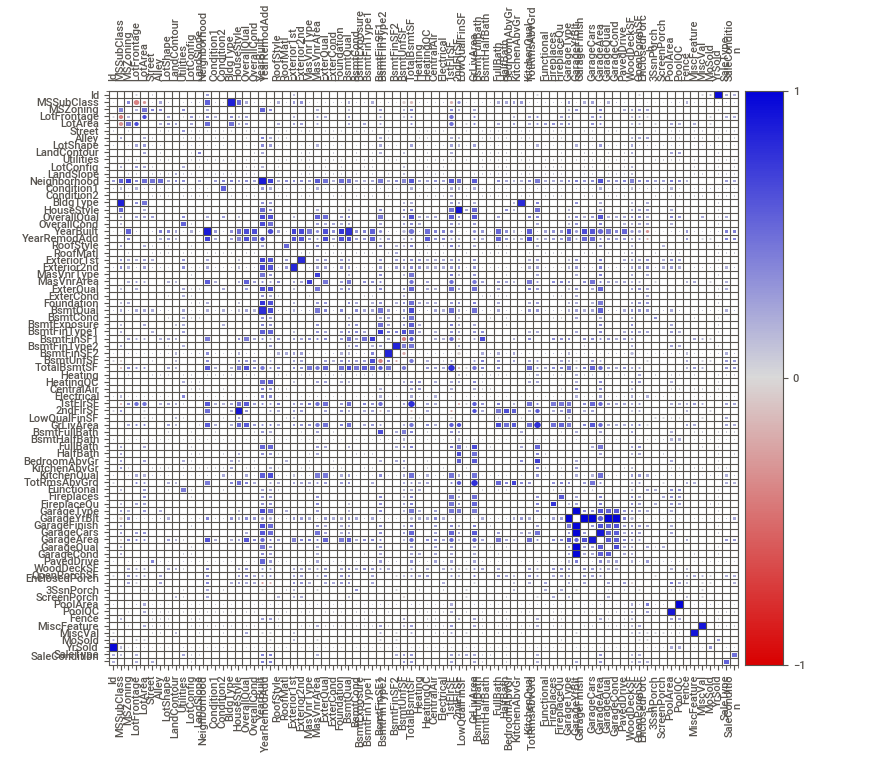

Report 'Report_aux.html' was saved to storage.


In [12]:
#my_report = sweetviz.compare([train, "Train"], [test, "Test"], "GarageCars")
my_report = sweetviz.compare([train_clean, "Train"],[test_clean,'Test'],"SalePrice")
#report = sweetviz.compare_intra(train_data, train_data["Sex"] == "male", ["male", "female"])
#my_report = sweetviz.analyze([eliminar_valores_atipicos_pca(train_df.dropna(axis=0),7), "Train"], "Transported")
#Generamos el html para poderlo visualizar por aparte
my_report.show_html(
    scale=None, #valor entre 0 y 1
    layout='vertical', #vertical es mucho mejor para dispositivos con pantallas pequeñas
    filepath='Reporte1_precios_casa.html')
#Ahora podemos hacer lo mismo para verlo directamente en el notebook
my_report.show_notebook(
    w=None, #Ancho en pixeles o en porcentajes
    h=None, #Altura en pixeles o en porcentajes
    scale=None, #valor entre 0 y 1
    #layout='vertical', #vertical es mucho mejor para dispositivos con pantallas pequeñas
    filepath='Report_aux.html')

Podemos observar que las características numéricas más relacionadas a `LotFrontage` son: 1stFlrSF(0.46), LotArea(0.43), GrLivArea(0.40), TotalBsmtSF(0.39) y MSSubClass(-0.39). Con respecto a las características categóticas tenemos: Neighborhood(0.30), BldgType(0.27), OverallQual(0.25), GarageCars(0.25), LotConfig(0.24), ..., LotShape(0.19).
Probemos algunas combinaciones para ver si encontramos alguna relación. 

Según nos indican los números deberíamos comenzar probando la relación entre LotFrontage y 1stFlrSF.
Antes de iniciar el análisis, estandaricemos los valores para visualizar mejor las relaciones.

In [13]:
def mean_norm(df_input):
    return df_input.apply(lambda x: (x-x.mean())/ x.std(), axis=0)
lotf_a=mean_norm(train_clean[['LotFrontage','LotArea','1stFlrSF','GrLivArea','TotalBsmtSF','MSSubClass']])
lotf_a=lotf_a.join(train_clean[['Neighborhood','BldgType','GarageCars','LotConfig']])

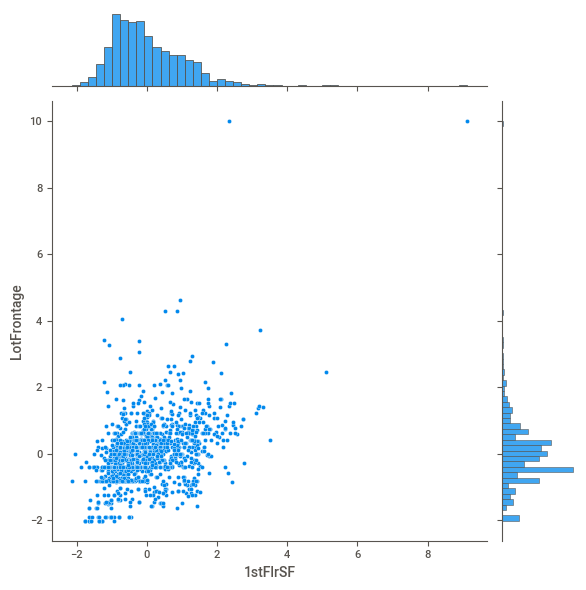

In [14]:
#sns.jointplot(data=train_clean,y='LotFrontage',x='1stFlrSF')
sns.jointplot(data=lotf_a,y='LotFrontage',x='1stFlrSF')

Podemos ver que existe una relación entre las variables. Entre mayor es el área del primer piso, mayor cantidad de calle estará conectada con la casa. Aún así, no es claro que la relación sea de tipo lineal.
Nos gustaría agregar también la información de las características categóricas. En este caso probaremos con las 2 más relacionadas que son Neighborhood y BldType. Además, tiene sentido usarlas, pues el sentido común nos dice que el barrio y el tipo de edificio deberían afectar a la variable analizada. Podríamos probar con otras, como por ejemplo LotConfig o GarageCar.

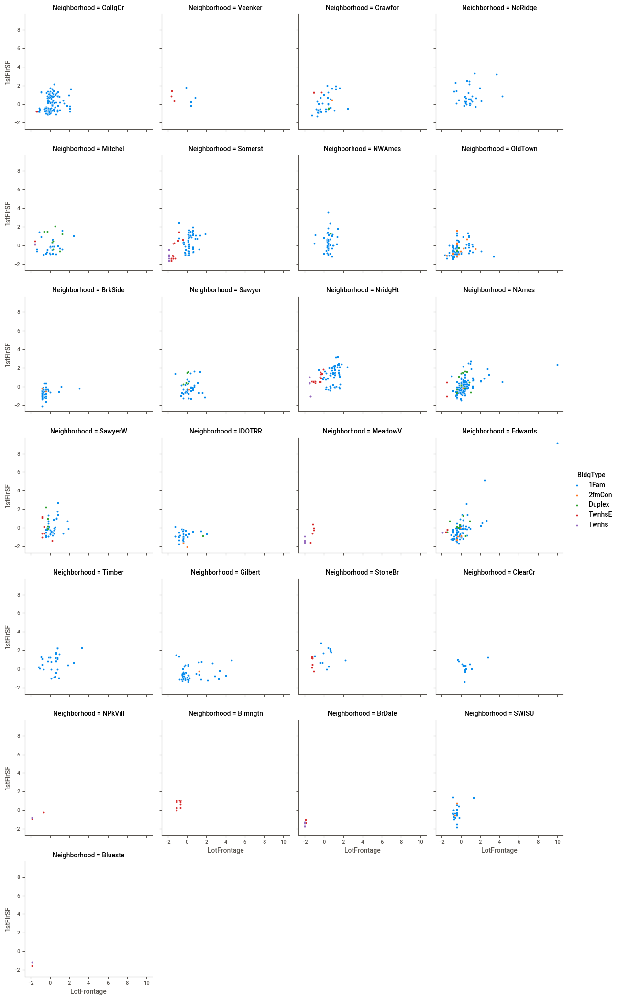

In [15]:
g=sns.FacetGrid(data=lotf_a,col='Neighborhood',hue='BldgType',col_wrap=4)
g.map(sns.scatterplot,'LotFrontage','1stFlrSF')
g.add_legend()

Aunque se nota la separación en algunos casos, sigue sin mostrarse una relación clara. Intentemos con LotSize.

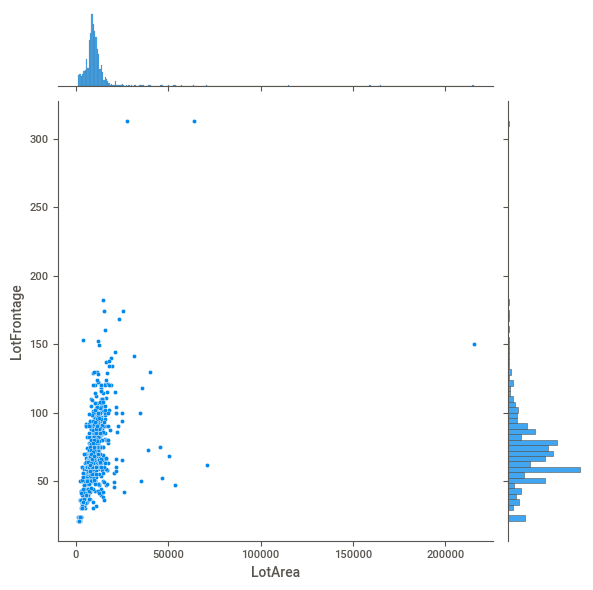

In [16]:
sns.jointplot(data=train_clean,y='LotFrontage',x='LotArea')

En este caso se nota muy claramente una relación lineal, salvo algunos casos aislados, entre más grande sea LotArea, mayor será LotFrontage. Veamos entonces la relación con las variables Neighborhood y BldgType.

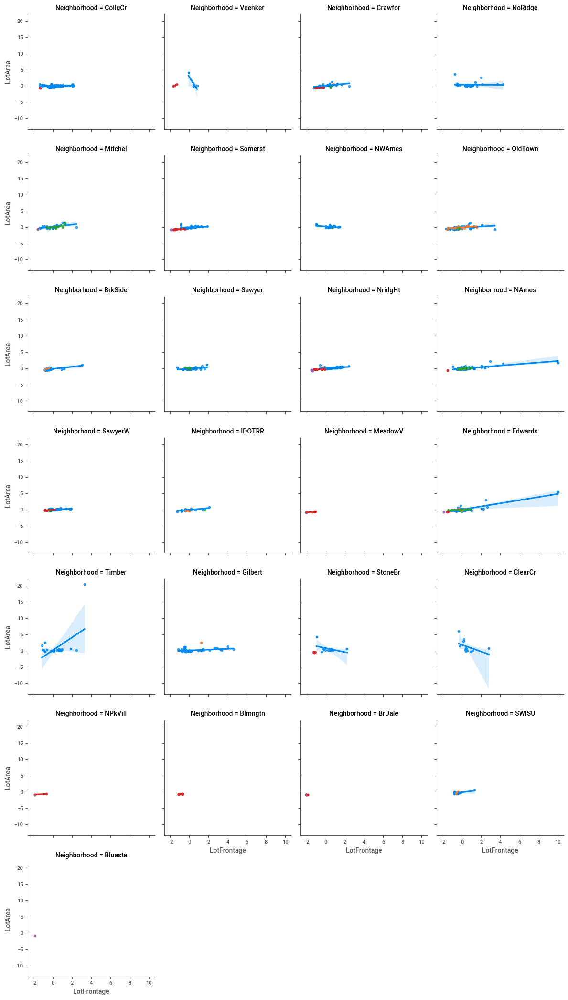

In [17]:
g=sns.FacetGrid(data=lotf_a,col='Neighborhood',hue='BldgType',col_wrap=4)
g.map(sns.regplot,'LotFrontage','LotArea')

##### 1.2.2.1 Llenado usando regresión lineal
Usaremos entonces para llenar los datos faltantes de LotFrontage las siguientes características: LotArea, Neighborhood, BldgType y ,adicionalmente, LotConfig y GarageCars, para lo cual usaremos una regresión lineal.

In [16]:
from sklearn.linear_model import LinearRegression

cat_feat= ['Neighborhood','BldgType']
cat_trans = Pipeline(steps=[
    ('oe', OrdinalEncoder()),
    ])

num_feat=['LotArea']
num_trans = Pipeline(steps=[
    ('si',SimpleImputer(strategy='constant',fill_value=0))
])

preproc = ColumnTransformer(transformers=[
    ('cat',cat_trans,cat_feat),
    ('num',num_trans,num_feat)
    ])

le = Pipeline(steps=[
    ('preproc',preproc),
    ('model',LinearRegression())
])

x=pd.concat([train,test])[cat_feat+num_feat+['LotFrontage']].copy()
x.dropna(axis=0,inplace=True)
y=x.pop('LotFrontage')
le.fit(x,y)
train_clean['CompleteLotFrontage']=pd.DataFrame(le.predict(train_clean),columns=['siy?'])
train_clean.LotFrontage=train_clean.LotFrontage.mask(train_clean.LotFrontage.isna(), train_clean.CompleteLotFrontage)
train_clean.drop('CompleteLotFrontage',axis=1,inplace=True)

test_clean['CompleteLotFrontage']=pd.DataFrame(le.predict(test_clean),columns=['siy?'])
test_clean.LotFrontage=test_clean.LotFrontage.mask(test_clean.LotFrontage.isna(), test_clean.CompleteLotFrontage)
test_clean.drop('CompleteLotFrontage',axis=1,inplace=True)



#### 1.2.3 Llenado de los demás datos faltantes

El resto de valores faltantes se llenarán usando NA en el caso de las características categóricas o usando la medio o la mediana en caso de ser numérico.

In [17]:
data_clean=pd.concat([train_clean,test_clean]).drop('SalePrice',axis=1)

cat_feat=list(data_clean.select_dtypes(include=['object']).columns)
disc_feat=list(data_clean.select_dtypes(include=['int64']).columns)
num_feat=list(data_clean.select_dtypes(include=['float64']).columns)

cat_trans=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='constant', fill_value='Missing'))
])
disc_trans=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='constant', fill_value=-1))
])
num_trans=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='mean'))
])

rellenar=ColumnTransformer(transformers=[
    ('cat',cat_trans,cat_feat),
    ('disc',disc_trans,disc_feat),
    ('num',num_trans,num_feat)
])

data_clean=rellenar.fit_transform(data_clean)
data_clean=pd.DataFrame(data_clean,columns=cat_feat+disc_feat+num_feat)
data_clean[disc_feat]=data_clean[disc_feat].astype('float64')
data_clean[num_feat]=data_clean[num_feat].astype('float64')
data_clean[cat_feat]=data_clean[cat_feat].astype('object')
train_ready=data_clean.iloc[0:1460,:].join(train.SalePrice)
test_ready=data_clean.iloc[1460:,:].reset_index().drop('index',axis=1)

#mascara=data_clean.isna().any(axis=1)
#faltantes=data_clean[mascara]
#msno.matrix(data_clean)
#plt.show() 

### 1.3 Selección de características

Una vez se han limpiado los datos, podemos pasar a la selección de características. Al haber tantas características, es difícil saber por donde comenzar. Ayudados por el informe de SweetViz, podemos obtener las variables que están más correlacionadas con nuestra variable objetivo. Tales variables son las siguientes:
* Numéricas: GrLivArea, GarageArea, TotalBsmtSF, 1stFlrSF, TotRmsAbvGrd, YearBuilt, YearRemodAdd, GarageYrBlt, MasVnrArea, BsmtFinSF1, LotFrontage, WoodDeckSF, 2ndFlrSF, OpenPorchSF, GarageCars,
* Categóricas: OverallQual, Neighborhood, ExterQual, BsmtQual, KitchenQual, FullBath, GarageFinish, FireplaceQu, Foundation, GarageType, Fireplaces, BsmtFinType1 y HeatingQC.

Sin embargo, debemos recordar que correlación no implica causalidad, así que debemos ser cuidadosos al momento de escoger las variables con las que entrenaremos al modelo. Veamos si tienen algún sentido. En las numéricas podemos observar que la mayoría están relacionadas al tamaño de la casa, con el año de construcción, remodelación o el año de construcción del garaje, así que tiene sentido que estén relacionadas al precio de la casa. Con respecto a las categóricas, están relacionadas a la calidad, por ejemplo de las cocina, a la localización y a características que pueda tener la casa. Así, se conservarán todas las características mencionadas anteriormente. 

Ahora buscaremos algunas otras que puedan tener relevancia para las 5 más importantes de cada categoría:
* GrLivArea: BedroomAbvGr
* GarageArea: -
* TotalBsmtSF: BsmtUnfSF, BsmtExposure, 
* 1stFlrSF: Fireplaces
* TotRmsAbvGrd: HouseStyle
* OverallQual: -
* Neighborhood: Exterior2nd, Exterior1st, MSZoning
* ExterQual: -
* BsmtQual: -
* KitchenQual: -
* FullBath: -


In [243]:
categoricas=['Neighborhood','ExterQual','BsmtQual','KitchenQual','GarageFinish','FireplaceQu','Foundation','GarageType','BsmtFinType1','HeatingQC','BsmtFinType2','HouseStyle','BsmtExposure', 'Exterior1st','MSZoning','LotShape','RoofStyle','MasVnrType','BldgType']
numericas=['OverallQual','GrLivArea','GarageArea','GarageCars','TotRmsAbvGrd','TotalBsmtSF','FullBath','1stFlrSF','YearBuilt','Fireplaces','YearRemodAdd','GarageYrBlt','MasVnrArea','BsmtFinSF1','LotFrontage','WoodDeckSF','2ndFlrSF','OpenPorchSF','BedroomAbvGr','BsmtUnfSF', 'LotArea']
len(categoricas+numericas)

40

De esta forma tenemos 40 características que nos serviran para nuestro modelo. ¡Logramos reducir la mitad! Como es nuestro primer experimento, **no agregaremos características derivadas**, aunque sería ideal si se quiere mejorar el puntaje.

### 1.4 Logaritmo de la variable objetivo
Debido a que la evaluación se realizará teniendo en cuenta el RMSE del logaritmo, calcularemos el logaritmo de la variable objetivo.

In [244]:
y_ready= train['SalePrice'].apply(np.log)
y_ready

0       12.247694
1       12.109011
2       12.317167
3       11.849398
4       12.429216
          ...    
1455    12.072541
1456    12.254863
1457    12.493130
1458    11.864462
1459    11.901583
Name: SalePrice, Length: 1460, dtype: float64

### 1.5 Modelo

Escogeremos CatBoost porque nos permite evitar la codificación de las variables categóricas, además de evitarnos el paso de optimizar los hiperparámetros de cualquier otro modelo.
Separemos entonces los datos de entrenamiento del modelo y los de validación.

In [111]:
x=train_ready[categoricas+numericas].copy()
y=y_ready.copy()
X_train, X_valid, y_train, y_valid = train_test_split(x,y,test_size=0.15, random_state=0)

booster = CatBoost({'verbose':10, 
                    'iterations':1000, 
                    'cat_features':[i for i in range(0,len(categoricas))], 
                    'eval_metric':'RMSE',
                    'loss_function':'RMSE',
                    'learning_rate':0.02})
booster.fit(X_train,y_train, eval_set=(X_valid,y_valid))

Neighborhood     object
ExterQual        object
BsmtQual         object
KitchenQual      object
GarageFinish     object
FireplaceQu      object
Foundation       object
GarageType       object
BsmtFinType1     object
HeatingQC        object
BsmtFinType2     object
HouseStyle       object
BsmtExposure     object
Exterior1st      object
MSZoning         object
LotShape         object
RoofStyle        object
MasVnrType       object
BldgType         object
OverallQual     float64
GrLivArea       float64
GarageArea      float64
GarageCars      float64
TotRmsAbvGrd    float64
TotalBsmtSF     float64
FullBath        float64
1stFlrSF        float64
YearBuilt       float64
Fireplaces      float64
YearRemodAdd    float64
GarageYrBlt     float64
MasVnrArea      float64
BsmtFinSF1      float64
LotFrontage     float64
WoodDeckSF      float64
2ndFlrSF        float64
OpenPorchSF     float64
BedroomAbvGr    float64
BsmtUnfSF       float64
LotArea         float64
dtype: object
0:	learn: 0.3987254	test: 

### 1.6 Evaluación del modelo
Aunque en los datos del entrenamiento nos va mostrando el error comparado con el conjunto de prueba, también podemos visualizar la importancia de las características del modelo:

In [113]:
y_predict=pd.Series(booster.predict(X_valid),name='y_predict')

from sklearn.metrics import mean_squared_error
mean_squared_error(y_valid,y_predict, squared=False)

0.13074017811802985

In [130]:
fi=booster.feature_importances_
features_dict = dict(zip(X_train.columns, list(fi)))
features_dict

{'Neighborhood': 3.3531530608733884,
 'ExterQual': 4.614234401274862,
 'BsmtQual': 2.409377979909241,
 'KitchenQual': 3.794437473626849,
 'GarageFinish': 2.8864597028283963,
 'FireplaceQu': 3.3544850265112918,
 'Foundation': 0.5507889620932005,
 'GarageType': 3.082674325607409,
 'BsmtFinType1': 0.91718163627011,
 'HeatingQC': 1.4433045476816797,
 'BsmtFinType2': 0.039515407229132424,
 'HouseStyle': 0.41322495412112603,
 'BsmtExposure': 0.6176419770449213,
 'Exterior1st': 0.5744310216790741,
 'MSZoning': 2.9140247699056396,
 'LotShape': 0.7305057817504257,
 'RoofStyle': 0.9075672888443542,
 'MasVnrType': 0.1503838629937803,
 'BldgType': 0.473895899278608,
 'OverallQual': 15.153991080546238,
 'GrLivArea': 14.586090097332836,
 'GarageArea': 2.590810839684795,
 'GarageCars': 2.7248955983027816,
 'TotRmsAbvGrd': 1.4685400402576272,
 'TotalBsmtSF': 5.164805104546116,
 'FullBath': 0.9121567682290974,
 '1stFlrSF': 4.048841021022395,
 'YearBuilt': 1.9496917523745638,
 'Fireplaces': 2.0783096951

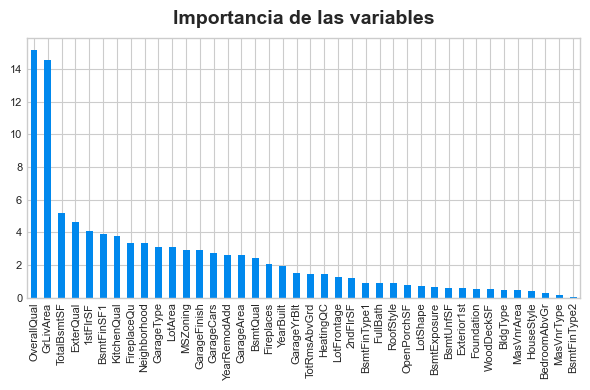

In [131]:
features_df = pd.DataFrame(features_dict, index=[0]).T.sort_values(by=[0], ascending=False).T
features_df.T.plot.bar(title="Importancia de las variables", legend=False);

Vemos que las dos características más relacionadas con la variable aparecieron con una mayor importancia. No obstante es demasiado en comparación con las demás. Se esperaba que Neighborhood tuviera un mayor impacto, al igual que las demás. Quizá haciendo más explícitas las relaciones entre las variables podamos aumentar su importancia.

### 1.7 Entrega

#### 1.7.1 Entrega 1
Entrenemos el modelo para la entrega:

In [116]:
booster_submit = CatBoost({'verbose':10, 
                    'iterations':2000, 
                    'cat_features':[i for i in range(0,len(categoricas))], 
                    'eval_metric':'RMSE',
                    'loss_function':'RMSE',
                    'learning_rate':0.01})
booster_submit.fit(x,y)

0:	learn: 0.3966812	total: 66ms	remaining: 2m 11s
10:	learn: 0.3722207	total: 608ms	remaining: 1m 49s
20:	learn: 0.3495986	total: 986ms	remaining: 1m 32s
30:	learn: 0.3291946	total: 1.41s	remaining: 1m 29s
40:	learn: 0.3107996	total: 1.93s	remaining: 1m 32s
50:	learn: 0.2945973	total: 2.33s	remaining: 1m 29s
60:	learn: 0.2792143	total: 2.87s	remaining: 1m 31s
70:	learn: 0.2655975	total: 3.42s	remaining: 1m 32s
80:	learn: 0.2533239	total: 3.87s	remaining: 1m 31s
90:	learn: 0.2416297	total: 4.37s	remaining: 1m 31s
100:	learn: 0.2315389	total: 4.75s	remaining: 1m 29s
110:	learn: 0.2222978	total: 5.13s	remaining: 1m 27s
120:	learn: 0.2139092	total: 5.54s	remaining: 1m 26s
130:	learn: 0.2060307	total: 5.94s	remaining: 1m 24s
140:	learn: 0.1989034	total: 6.33s	remaining: 1m 23s
150:	learn: 0.1925205	total: 6.83s	remaining: 1m 23s
160:	learn: 0.1867922	total: 7.2s	remaining: 1m 22s
170:	learn: 0.1816389	total: 7.57s	remaining: 1m 20s
180:	learn: 0.1768891	total: 7.96s	remaining: 1m 19s
190:	l

In [132]:
df=pd.DataFrame()
df['Id']=test_ready['Id'].astype('int64')
df['SalePrice']=pd.DataFrame(booster_submit.predict(test_ready[categoricas+numericas]),columns=['SalePrice']).apply(np.exp)
df.to_csv('submit.csv', index=False)
#test_ready.Id

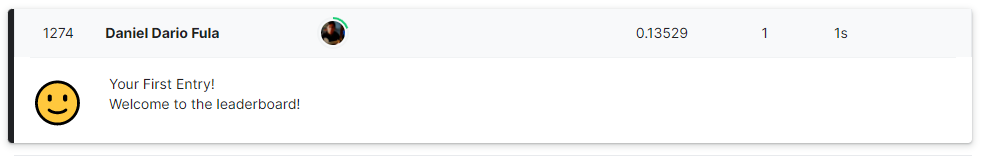

#### 1.7.2 Entrega 2
No se superó la meta, pero fue un buen puntaje para ser la primera vez que se envía. Podríamos intentar aumentar las iteraciones para mejorar el resultado.

In [133]:
booster_submit = CatBoost({'verbose':10, 
                    'iterations':4000, 
                    'cat_features':[i for i in range(0,len(categoricas))], 
                    'eval_metric':'RMSE',
                    'loss_function':'RMSE',
                    'learning_rate':0.01})
booster_submit.fit(x,y)

0:	learn: 0.3966812	total: 36.7ms	remaining: 2m 26s
10:	learn: 0.3722207	total: 486ms	remaining: 2m 56s
20:	learn: 0.3495986	total: 965ms	remaining: 3m 2s
30:	learn: 0.3291946	total: 1.37s	remaining: 2m 55s
40:	learn: 0.3107996	total: 1.84s	remaining: 2m 57s
50:	learn: 0.2945973	total: 2.27s	remaining: 2m 56s
60:	learn: 0.2792143	total: 2.77s	remaining: 2m 58s
70:	learn: 0.2655975	total: 3.23s	remaining: 2m 58s
80:	learn: 0.2533239	total: 3.62s	remaining: 2m 55s
90:	learn: 0.2416297	total: 4.07s	remaining: 2m 54s
100:	learn: 0.2315389	total: 4.52s	remaining: 2m 54s
110:	learn: 0.2222978	total: 5.06s	remaining: 2m 57s
120:	learn: 0.2139092	total: 5.55s	remaining: 2m 57s
130:	learn: 0.2060307	total: 6.06s	remaining: 2m 59s
140:	learn: 0.1989034	total: 6.58s	remaining: 3m
150:	learn: 0.1925205	total: 7.09s	remaining: 3m
160:	learn: 0.1867922	total: 7.46s	remaining: 2m 57s
170:	learn: 0.1816389	total: 7.93s	remaining: 2m 57s
180:	learn: 0.1768891	total: 8.37s	remaining: 2m 56s
190:	learn: 

In [134]:
df=pd.DataFrame()
df['Id']=test_ready['Id'].astype('int64')
df['SalePrice']=pd.DataFrame(booster_submit.predict(test_ready[categoricas+numericas]),columns=['SalePrice']).apply(np.exp)
df.to_csv('submit2.csv', index=False)

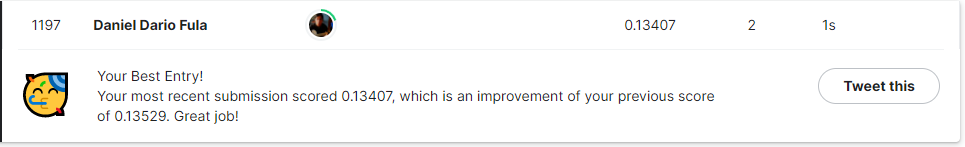

Mejoró la puntuación, intentémoslo nuevamente, pero ahora con 10000 iteraciones.

#### 1.7.3 Entrega 3

In [135]:
booster_submit = CatBoost({'verbose':100, 
                    'iterations':10000, 
                    'cat_features':[i for i in range(0,len(categoricas))], 
                    'eval_metric':'RMSE',
                    'loss_function':'RMSE',
                    'learning_rate':0.01})
booster_submit.fit(x,y)

0:	learn: 0.3966812	total: 39.1ms	remaining: 6m 30s
100:	learn: 0.2315389	total: 4.29s	remaining: 7m
200:	learn: 0.1686175	total: 8.95s	remaining: 7m 16s
300:	learn: 0.1414671	total: 14.1s	remaining: 7m 33s
400:	learn: 0.1278084	total: 19.4s	remaining: 7m 44s
500:	learn: 0.1198399	total: 24.4s	remaining: 7m 42s
600:	learn: 0.1145711	total: 29.4s	remaining: 7m 39s
700:	learn: 0.1103481	total: 34.5s	remaining: 7m 37s
800:	learn: 0.1071212	total: 39.5s	remaining: 7m 34s
900:	learn: 0.1045593	total: 44.7s	remaining: 7m 31s
1000:	learn: 0.1024357	total: 50.1s	remaining: 7m 30s
1100:	learn: 0.0999112	total: 55.2s	remaining: 7m 25s
1200:	learn: 0.0976207	total: 1m	remaining: 7m 23s
1300:	learn: 0.0957242	total: 1m 5s	remaining: 7m 18s
1400:	learn: 0.0940029	total: 1m 10s	remaining: 7m 14s
1500:	learn: 0.0923287	total: 1m 16s	remaining: 7m 11s
1600:	learn: 0.0903724	total: 1m 21s	remaining: 7m 5s
1700:	learn: 0.0886524	total: 1m 26s	remaining: 7m
1800:	learn: 0.0869138	total: 1m 31s	remaining:

Antes de enviarlo, revisemos las características

In [136]:
fi=booster_submit.feature_importances_
features_dict = dict(zip(X_train.columns, list(fi)))
features_dict

{'Neighborhood': 3.104020705405816,
 'ExterQual': 2.8098361365980136,
 'BsmtQual': 2.7509920007633886,
 'KitchenQual': 3.8953279776495604,
 'GarageFinish': 2.9394203743095084,
 'FireplaceQu': 3.790702317529664,
 'Foundation': 1.2636768086268073,
 'GarageType': 1.5908507937804792,
 'BsmtFinType1': 1.0654632704593197,
 'HeatingQC': 1.5211173535313722,
 'BsmtFinType2': 0.42600498950928384,
 'HouseStyle': 0.7572727523397645,
 'BsmtExposure': 0.8348510305238465,
 'Exterior1st': 1.1370487402963565,
 'MSZoning': 2.840240375911206,
 'LotShape': 0.578838392758006,
 'RoofStyle': 0.6078734858424182,
 'MasVnrType': 0.6150977767220259,
 'BldgType': 0.39601853779959517,
 'OverallQual': 14.446717430370304,
 'GrLivArea': 14.283048943906168,
 'GarageArea': 2.1081526870191714,
 'GarageCars': 2.375093865678368,
 'TotRmsAbvGrd': 0.6249939534194329,
 'TotalBsmtSF': 5.3205351786837864,
 'FullBath': 0.9744647530615511,
 '1stFlrSF': 3.856099478499685,
 'YearBuilt': 2.620020904208307,
 'Fireplaces': 1.50789808

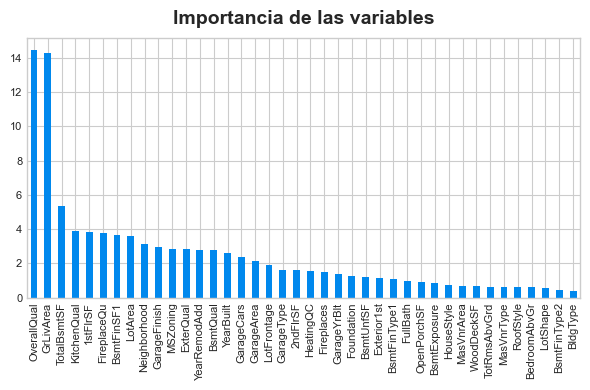

In [138]:
features_df = pd.DataFrame(features_dict, index=[0]).T.sort_values(by=[0], ascending=False).T
features_df.T.plot.bar(title="Importancia de las variables", legend=False);

En comparación con el anterior, ExterQual bajó de posición.

In [141]:
df=pd.DataFrame()
df['Id']=test_ready['Id'].astype('int64')
df['SalePrice']=pd.DataFrame(booster_submit.predict(test_ready[categoricas+numericas]),columns=['SalePrice']).apply(np.exp)
df.to_csv('submit3.csv', index=False)

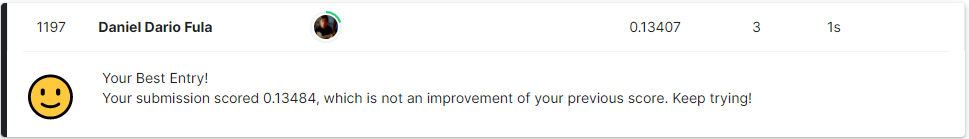
En este caso ya no hubo mejora, por lo que probablemente el modelo empezó a hacer sobreajuste y dejó de tomar los patrones correctos.

### 1.8 Mejoras a probar

En el curso de Kaggle se recomienda:
1. Crear nuevas características usando funciones matemáticas, por ejemplo:
    * `LivLotRatio`: la razón de `GrLivArea` con `LotArea`
    * `Spaciousness`: la suma de `FirstFlrSF` y `SecondFlrSF` dividida por `TotRmsAbvGrd`
    * `TotalOutsideSF`: la suma de `WoodDeckSF`, `OpenPorchSF`, `EnclosedPorch`, `Threeseasonporch` y `ScreenPorch`
2. Buscar relaciones entre variables que no se usen y hacerlas explícitas. Como muestra, en el curso se mostró que BldgType y GrLivArea tienen una relación (revisar que esto sea cierto) y se hizo explícita usando el método de los dummies
3. Conteo de características: Muchas veces las características están relacionadas por su nombre y podemos explotar eso para encontrar nuevas características. En el ejercicio del curso se creó la característica `PorchTypes`, donde se cuenta cuántos de los siguientes son mayores que 0: 
```
WoodDeckSF
OpenPorchSF
EnclosedPorch
Threeseasonporch
ScreenPorch
```
4. Explotar una categoría de texto: ¿Hay variables de las que pueda sacar información adicional? En el ejercicio estaba MSSubClass, compuesta de texto al cual le extrajeron la primera palabra y con ella crearon una nueva característica llamada MSClass
5. Usar una transformación agrupada: Por ejemplo, el valor de una casa depende frecuentemente de cómo se le compara con las casas usuales en su vecindario. En el ejercicio se creó la característica MedNhbdArea, que describe la mediana de GrLivArea agrupada por Neighborhood.
6. ¿Qué variables se pueden reescalar (con miras a hacer agrupamiento KMeans)? Por ejemplo, se escalarían LotArea y Living Area si se hace un cluster con ellas, para que las unidades no afecten la relación que tienen las variables. En el ejercicio se agruparon las variables: 'LotArea','TotalBsmtSF','FirstFlrSF','SecondFlrSF' y 'GrLivArea'.
7. Hacer clusters de variables y agregarlos al conjunto de datos
8. Agregar también la distancia a los centroides de los clusteres hallados
9. Hacer PCA para encontrar relaciones o características ocultas. Por lo general PCA se hace con valores estandarizados para que tengan interpretación como correlación y no como covarianza. Intente interpretar las cargas de los componentes. En el ejemplo se compararon "GarageArea", "YearRemodAdd", "TotalBsmtSF", "GrLivArea"-
10. Cree nuevas características inspirado en las cargas de los componentes o simplemente agregando las componentes de X_pca. Por ejemplo sumas cuando las cargas son todas positivas y multiplicaciones cuando hay unas positivas y otras negativas (no olvide la interpretación)
11. Detecte y elimine los datos atípicos usando PCA.
12. Use TargetEncoding para potenciar las variables categóricas (entre más datos únicos tenga será mejor para aplicar este método. Puede usar nunique o value_counts para ver las características a las que le gustaría aplicar TargeEncoding). Recuerde separar los datos en datos de codificación y datos de entrenamiento para evitar hacer overfitting y que el modelo no prediga bien.

## Experimento 2

### 2.1 Comentarios y mejoras con respecto al experimento 1

Para comenzar, observemos que MSSubClass está dada como un conjunto de enteros y por tanto no fue tratada como una variable categórica. También hay muchas variables categóricas a las que se les puede asignar un orden, como las de las cualidades. En conclusión, debemos hacer un mejor tratamiento de los datos antes de construir el modelo. 

### 2.2 Carga de archivos

In [18]:
train ,test = loadData('train.csv','test.csv') 

### 2.3 Mejoras en los datos
Para una mejor legibilidad y uso del notebook, definamos una pipeline que nos deje los datos en limpio con los ajustes que necesitamos.  Para ello primero definamos claramente los tipos de características que tenemos.

Luego, debemos ajustar tanto las ranker_cat como las ranker_num para que queden con valores entre 0 y 1 o -1 y 1. Además también sería sensato estandarizar algunas de ellas, como lo son las áreas.

In [310]:
from sklearn.linear_model import LinearRegression
def convertir_tipos_datos(dataframe):
    df=dataframe.copy()
    mssubclass_dic={
        20:'1-STORY 1946 & NEWER ALL STYLES',
        30:'1-STORY 1945 & OLDER',
        40:'1-STORY W/FINISHED ATTIC ALL AGES',
        45:'1-1/2 STORY - UNFINISHED ALL AGES',
        50:'1-1/2 STORY FINISHED ALL AGES',
        60:'2-STORY 1946 & NEWER',
        70:'2-STORY 1945 & OLDER',
        75:'2-1/2 STORY ALL AGES',
        80:'SPLIT OR MULTI-LEVEL',
        85:'SPLIT FOYER',
        90:'DUPLEX - ALL STYLES AND AGES',
       120:'1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
       150:'1-1/2 STORY PUD - ALL AGES',
       160:'2-STORY PUD - 1946 & NEWER',
       180:'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
       190:'2 FAMILY CONVERSION - ALL STYLES AND AGES'}
    df.MSSubClass=df.MSSubClass.astype('int64')
    df.MSSubClass=df.MSSubClass.apply(lambda x: mssubclass_dic[x])
    ranker_cat=['LotShape','LandContour','LandSlope','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual','FireplaceQu','GarageFinish','GarageQual','GarageCond','PavedDrive','PoolQC','Fence']
    quality_dic={
                'Ex':1,
                'Gd':0.9,
                'TA':0.7,
                'Fa':0.5,
                'Po':0.3,
                'NA':0}
    bsmtexposure_dic={
        'Gd':1,
        'Av':0.6,
        'Mn':0.3,
        'No':0,
        'NA':-0.5,
        'Missing':-1,
    }
    df.BsmtExposure=df.BsmtExposure.apply(lambda x: bsmtexposure_dic[x])
    calidad=['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond','PoolQC'] #Convertir a num
    for caracteristica in calidad:
        df[caracteristica]=df[caracteristica].apply(lambda x:quality_dic[x])
    lotshape_dic={'Reg':1,'IR1':0.7,'IR2':0.4,'IR3':0}
    
    df.LotShape=df.LotShape.apply(lambda x: lotshape_dic[x])
    landcontour_dic={'Lvl':0,'Bnk':0.5,'HLS':1,'Low':-1}
    df.LandContour=df.LandContour.apply(lambda x: landcontour_dic[x])
    landslope_dic={'Gtl':0.1,'Mod':0.2,'Sev':0.5}
    df.LandSlope=df.LandSlope.apply(lambda x: landslope_dic[x])
    bsmtfintype_dic={
                    'GLQ':1,
                    'ALQ':0.8,
                    'BLQ':0.7,
                    'Rec':0.6,
                    'LwQ':0.4,
                    'Unf':0.2,
                    'NA':0,
                    'Missing':-1}
    df.BsmtFinType1=df.BsmtFinType1.apply(lambda x: bsmtfintype_dic[x])
    df.BsmtFinType2=df.BsmtFinType2.apply(lambda x: bsmtfintype_dic[x])
    garagefin_dic={
        'Fin':1,
        'RFn':0.7,
        'Unf':0.3,
        'NA':0}
    df.GarageFinish=df.GarageFinish.apply(lambda x: garagefin_dic[x])
    paveddrive_dic={
        'Y':1,
        'P':0.5,
        'N':0}
    df.PavedDrive=df.PavedDrive.apply(lambda x: paveddrive_dic[x])
    fence_dic={
        'GdPrv':1,
        'MnPrv':0.8,
        'GdWo':0.6,
        'MnWw':0.4,
        'NA':0}
    df.Fence=df.Fence.apply(lambda x: fence_dic[x])
    ranker_num=['OverallQual','OverallCond']
    for carac in ranker_num:
        df[carac]=df[carac]/10
    df[ranker_num]=df[ranker_num].astype('float64')
    numericas=['Id']
    df.Id=df.Id.astype('float64')
    categoricas=['MSSubClass','Alley','HouseStyle','Utilities','BldgType','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','Foundation','Heating','Electrical','Functional','GarageType','MiscFeature','SaleType','SaleCondition']
    df[categoricas]=df[categoricas].astype('category')
    areas=['LotArea','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','GarageArea','MasVnrArea']
    df[areas]=df[areas].astype('float64')
    lineales=['LotFrontage']
    df[lineales]=df[lineales].astype('float64')
    dinero=['MiscVal']
    df[dinero]=df[dinero].astype('float64')
    booleanas=['CentralAir'] #Convertir a bool
    df.CentralAir=df.CentralAir.apply(lambda x: x=='Y')
    localizacion=['Neighborhood','MSZoning','Street','LotConfig','Condition1','Condition2']
    df[localizacion]=df[localizacion].astype('category')
    conteos=['FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','BsmtFullBath','BsmtHalfBath','GarageCars']
    df[conteos]=df[conteos].astype('int64')
    fechas=['YearBuilt','YearRemodAdd','MoSold','YrSold','GarageYrBlt']
    df[fechas]=df[fechas].astype('int64')
    #objetivo=['SalePrice']
    #df[objetivo]=df[objetivo].astype('float64')
    return df

#------- Regresión para llenar LotFrontage
def llenarLotFrontage(dataframe):
    df=dataframe.copy()
    # -- Definición de los transformers para LotFrontage
    lf_cat_feat= ['Neighborhood','BldgType']
    lf_cat_trans = Pipeline(steps=[
        ('oe', OrdinalEncoder()),
        ])
    lf_num_feat=['LotArea']
    lf_num_trans = Pipeline(steps=[
        ('si',SimpleImputer(strategy='constant',fill_value=0))
    ])
    
    lotfrontage_ct = ColumnTransformer(transformers=[
        ('cat',cat_trans,cat_feat),
        ('num',num_trans,num_feat)
        ])
    
    lotfrontage_lr = Pipeline(steps=[
        ('preproc',lotfrontage_ct),
        ('model',LinearRegression())
    ])
    
    x=df[lf_cat_feat+lf_num_feat+['LotFrontage']].copy()
    x.dropna(axis=0,inplace=True)
    y=x.pop('LotFrontage')
    lotfrontage_lr.fit(x,y)
    df['CompleteLotFrontage']=pd.DataFrame(lotfrontage_lr.predict(df),columns=['cualquiernombre'])
    df.LotFrontage=df.LotFrontage.mask(df.LotFrontage.isna(), df.CompleteLotFrontage)
    df.drop('CompleteLotFrontage',axis=1,inplace=True)
    return df

### Pipeline para el llenado en general de los datos
data_clean=pd.concat([train_clean,test_clean]).drop('SalePrice',axis=1)

# --------Definición de características en general
carac_numericas=['Id']
carac_categoricas=['MSSubClass', 'Alley', 'HouseStyle', 'Utilities', 'BldgType', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'Electrical', 'Functional', 'GarageType', 'MiscFeature', 'SaleType', 'SaleCondition']
carac_rank_num=['OverallQual', 'OverallCond']
carac_rank_cat=['LotShape', 'LandContour', 'LandSlope', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'] #Convertir a num
carac_rank=carac_rank_num+carac_rank_cat
carac_areas=['LotArea', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'WoodDeckSF' , 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',  'ScreenPorch', 'PoolArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'GarageArea' ,'MasVnrArea']
carac_lineales=['LotFrontage']
carac_dinero=['MiscVal']
carac_booleanas=['CentralAir'] #Convertir a bool
carac_localizacion=['Neighborhood', 'MSZoning' ,'Street', 'LotConfig', 'Condition1', 'Condition2']
carac_conteos=['FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'BsmtFullBath', 'BsmtHalfBath', 'GarageCars']
carac_fechas=['YearBuilt', 'YearRemodAdd', 'MoSold', 'YrSold', 'GarageYrBlt']
carac_objetivo=['SalePrice']

trans_numericas=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='constant', fill_value=-1))
])

trans_categoricas=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='most_frequent'))
])

trans_rank=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='most_frequent'))
])

trans_areas=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='median')),
    #('stdscal',StandardScaler())
])

trans_lineales=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='median')),
    #('stdscal',StandardScaler()),
])

trans_dinero=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='mean'))
])

trans_booleanas=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='most_frequent'))
])

trans_localizacion=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='constant', fill_value='Missing'))
])

trans_conteos=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='constant', fill_value=-1))
])

trans_fechas=Pipeline(steps=[
    ('simpleimputer',SimpleImputer(strategy='most_frequent'))
])


ct=ColumnTransformer(transformers=[
    ('num',trans_numericas,carac_numericas),
    ('cat',trans_categoricas,carac_categoricas),
    ('rank',trans_rank,carac_rank),
    ('areas',trans_areas,carac_areas),
    ('perim',trans_lineales,carac_lineales),
    ('dinero',trans_dinero,carac_dinero),
    ('bool',trans_booleanas, carac_booleanas),
    ('loc',trans_localizacion, carac_localizacion),
    ('cont',trans_conteos, carac_conteos),
    ('fechas',trans_fechas, carac_fechas),
],remainder='passthrough')

llenarNA_transformer= FunctionTransformer(llenarNA)
llenarLotFrontage_transformer= FunctionTransformer(llenarLotFrontage)
convertirTiposDatos_transformer= FunctionTransformer(convertir_tipos_datos)
def aDataFrame(arreglo):
    return pd.DataFrame(arreglo,columns=nombres_columnas)
aDataFrame_transformer=FunctionTransformer(aDataFrame)

datos_pl=Pipeline(steps=[
    ('llenarNA',llenarNA_transformer),
    ('llenarLF',llenarLotFrontage_transformer),
    ('coltrans',ct),
    ('aDataFrame',aDataFrame_transformer),
    ('convTipo',convertirTiposDatos_transformer),
])
    
#Datos
objetivo=train.SalePrice.apply(np.log)
datos_train_test=pd.concat([train.drop('SalePrice',axis=1),test])
nombres_columnas=carac_numericas + carac_categoricas + carac_rank + carac_areas + carac_lineales + carac_dinero + carac_booleanas + carac_localizacion + carac_conteos + carac_fechas
carac_objetivo=['SalePrice']
datos_limpios=datos_pl.fit_transform(datos_train_test)
datos_limpios=pd.DataFrame(datos_limpios,columns=nombres_columnas)

train_clean=datos_limpios.iloc[0:1460,:].join(objetivo)
test_clean=datos_limpios.iloc[1460:,:].reset_index().drop('index',axis=1)

#train_clean.info()
#plt.show() 

                                             |                                             | [  0%]   00:00 ->…

D:\DataScience\Spacial_titanic_project\env\lib\site-packages\sweetviz\graph.py:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figure.savefig(as_raw_bytes, format='png', transparent=True)


Report Reporte1_precios_casa.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



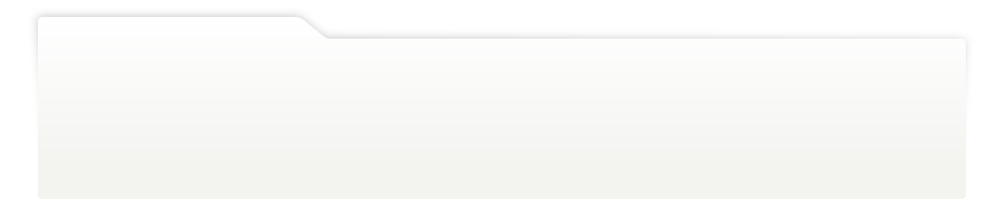
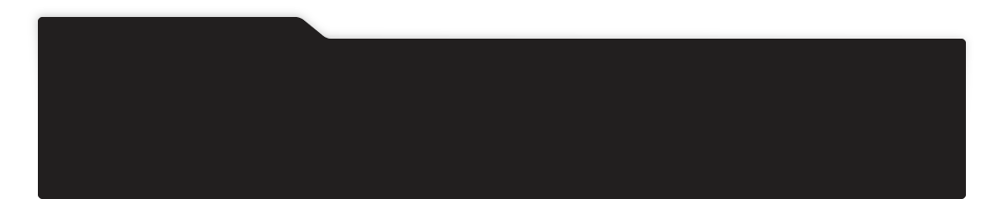
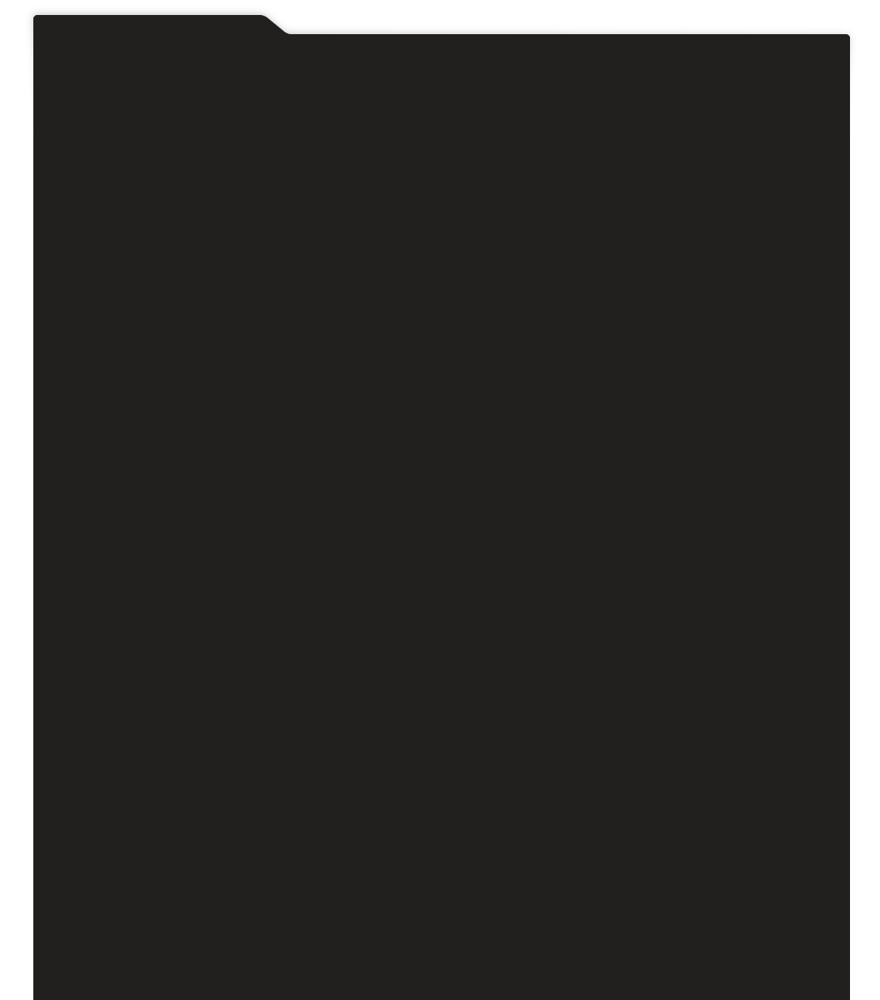
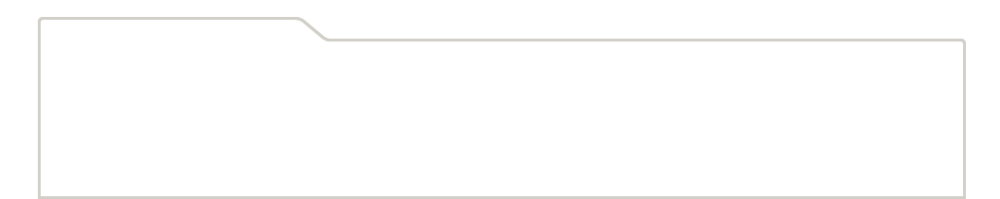
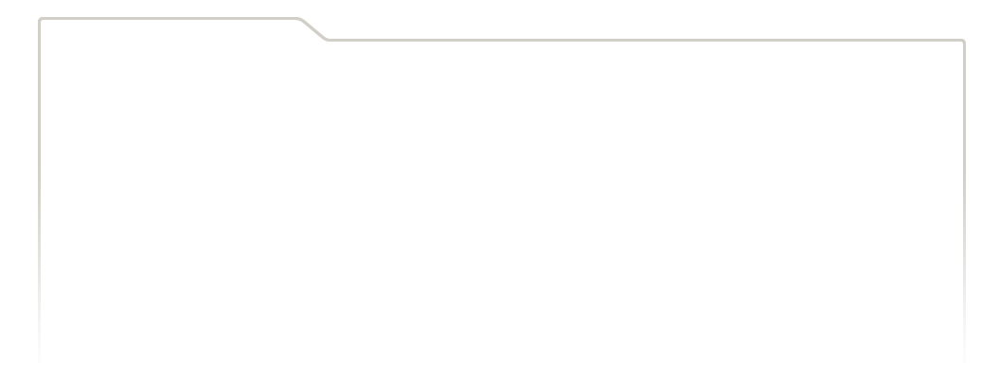
...
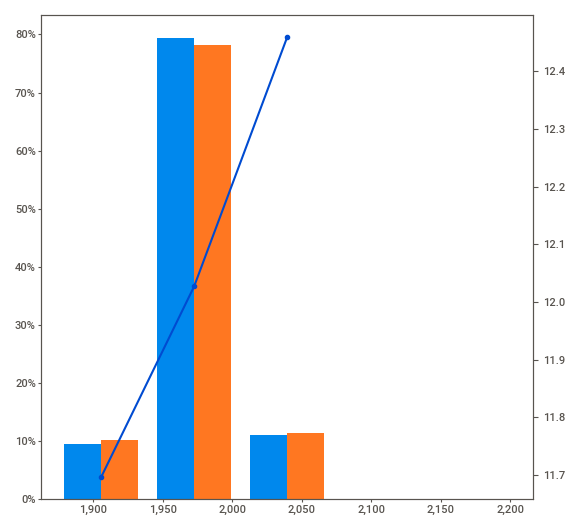
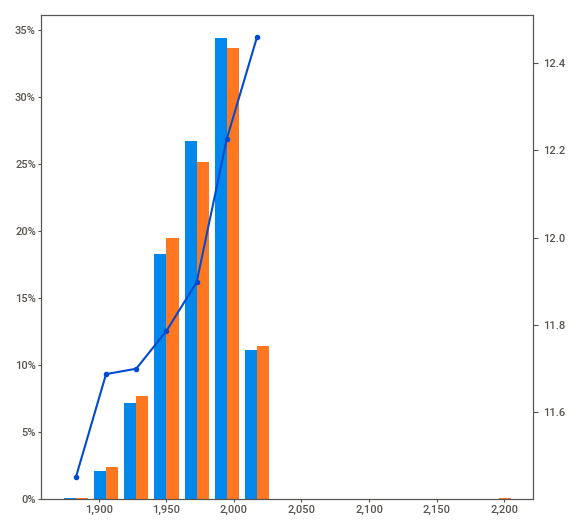
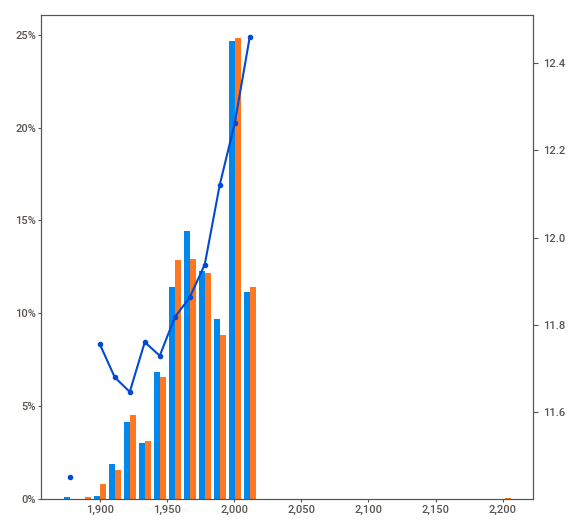
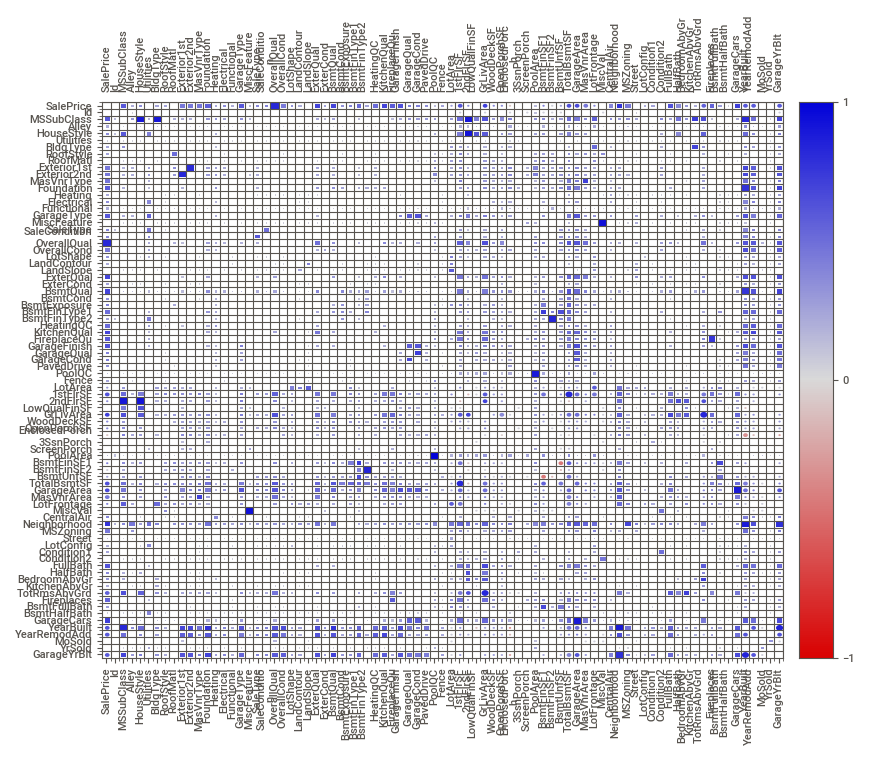
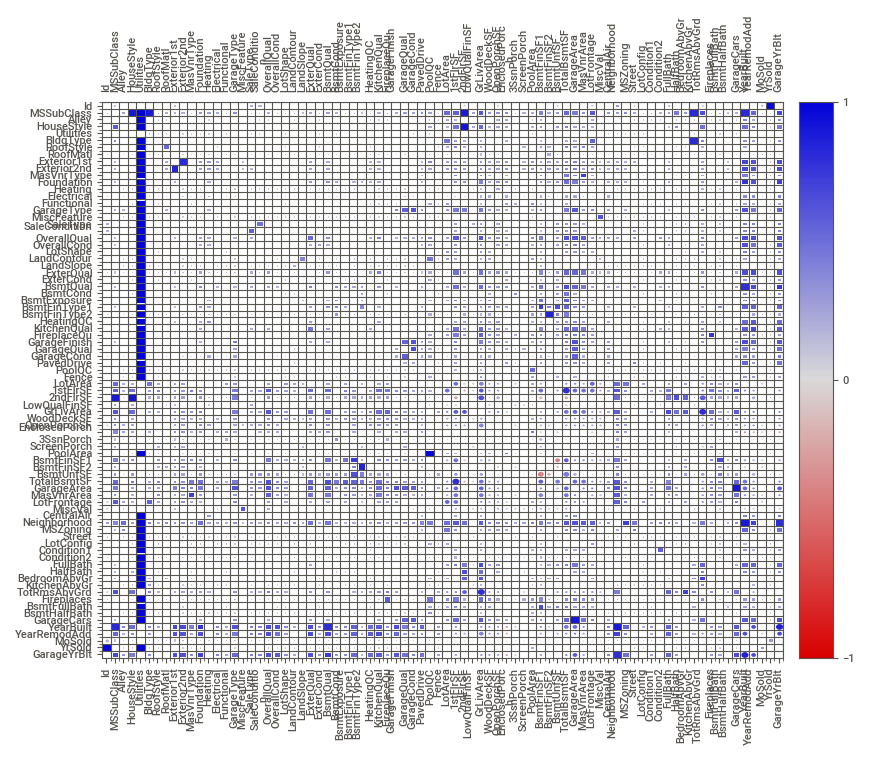

Report 'Report_aux.html' was saved to storage.


In [79]:
#my_report = sweetviz.compare([train, "Train"], [test, "Test"], "GarageCars")
my_report = sweetviz.compare([train_clean, "Train"],[test_clean,'Test'],"SalePrice")
#report = sweetviz.compare_intra(train_data, train_data["Sex"] == "male", ["male", "female"])
#my_report = sweetviz.analyze([eliminar_valores_atipicos_pca(train_df.dropna(axis=0),7), "Train"], "Transported")
#Generamos el html para poderlo visualizar por aparte
my_report.show_html(
    scale=None, #valor entre 0 y 1
    layout='vertical', #vertical es mucho mejor para dispositivos con pantallas pequeñas
    filepath='Reporte1_precios_casa.html')
#Ahora podemos hacer lo mismo para verlo directamente en el notebook
my_report.show_notebook(
    w=None, #Ancho en pixeles o en porcentajes
    h=None, #Altura en pixeles o en porcentajes
    scale=0.8, #valor entre 0 y 1
    layout='vertical', #vertical es mucho mejor para dispositivos con pantallas pequeñas
    filepath='Report_aux.html')

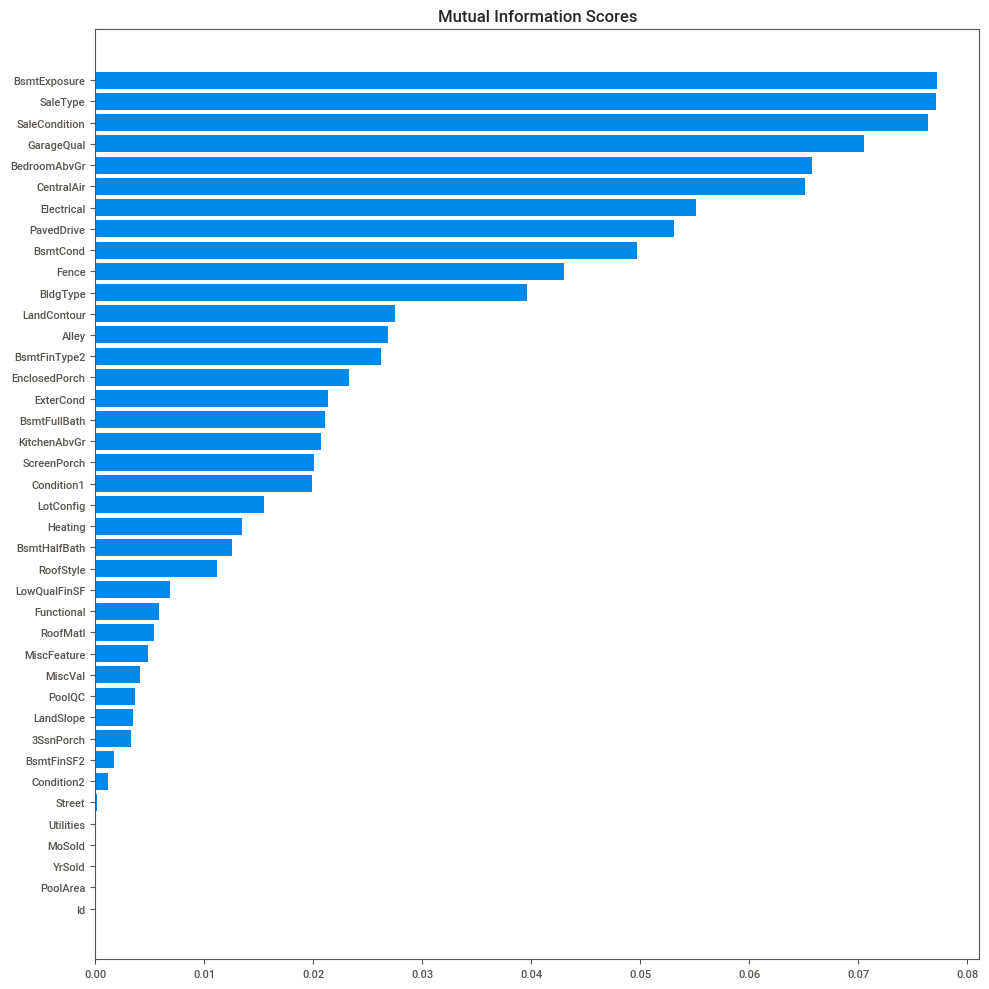

In [342]:
mi_scores=make_mi_scores_regression(train_clean.drop('SalePrice',axis=1),objetivo)
plot_mi_scores(mi_scores.tail(40))

### 2.4 Características derivadas

#### 2.4.1 Operaciones matemáticas entre características
Haciendo caso a la primera sugerencia, incorporaremos las siguientes características:
* `LivLotRatio`: la razón de `GrLivArea` con `LotArea`
* `Spaciousness`: la suma de `FirstFlrSF` y `SecondFlrSF` dividida por `TotRmsAbvGrd`
* `TotalOutsideSF`: la suma de `WoodDeckSF`, `OpenPorchSF`, `EnclosedPorch`, `Threeseasonporch` y `ScreenPorch`

Pero antes de hacerlo, razonemos un poco sobre el porqué tiene sentido incorporarlas.

##### LivLotRatio
La razón entre el área para vivir (por encima del nivel de la tierra) y el área del lote nos da una idea sobre qué tanto espacio está disponible realmetne para aprovechar la casa. Esto puede ser un factor determinante para decidir si comprar o no una casa.

In [334]:
train_mod=train_clean.copy()
test_mod=test_clean.copy()
def agregar_livlotratio(dataframe):
    df=dataframe.copy()
    df['LivLotRatio']= df.GrLivArea / df.LotArea
    return df
train_mod=agregar_livlotratio(train_mod)
objetivo.corr(train_mod.LivLotRatio)

0.00118907109358217

Como vemos, no parece estar muy correlacionada con el valor del objetivo. Veamos una gráfica.

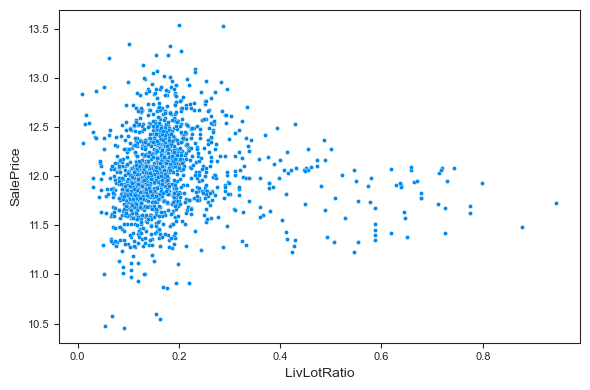

In [272]:
sns.scatterplot(data=train_mod, x='LivLotRatio', y='SalePrice');

Cieramente no parece haber una relación (lineal) clara entre estas características. Veamos qué nos dice la información mutua, depronto pueda haber algun otro tipo de información que nos pueda aportar comparada con otra que no muestra ninguna relación, tomemos por ejemplo LowQualFinSF:

-0.03796280313742696

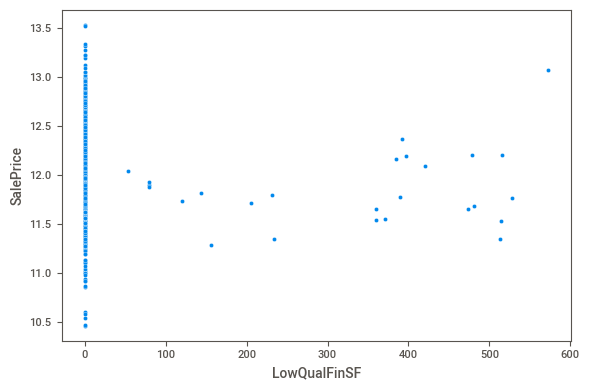

In [346]:
sns.scatterplot(data=train_mod,x='LowQualFinSF',y='SalePrice')
train_mod.LowQualFinSF.corr(objetivo)

Ciertamente no parece tener mucho que decir acerca del precio de venta de las casas, pero su correlación es mucho mejor que con la variable que creamos. No obstante, antes de descartarla, veamos qué dice la información mutua acerca de esta nueva característica:

In [344]:
list(mutual_info_regression(train_mod[['LivLotRatio','LowQualFinSF']],train_mod['SalePrice']))

[0.1065767046649615, 0.0029261431248019942]

Eso nos quiere decir que sí hay una relación, no tan estrecha pero sí existente, entre la nueva característica y nuestro objetivo.

##### Spaciousness
Considerar la suma de `1stFlrSF` y `2ndFlrSF` dividida por `TotRmsAbvGrd` nos daría una especie de indicativo de qué tan espaciosa es la casa. Pero hagamos otra propuesta y dividámoslo todo por el total de cuartos más la cantidad de habitaciones para dormir, la cantidad de cocinas y la cantidad de baños que hay sobre el nivel de la tierra.

In [347]:
def agregar_spaciousness(dataframe):
    df=dataframe.copy()
    df['Spaciousness']= (df['1stFlrSF'] + df['2ndFlrSF'])/(df.TotRmsAbvGrd+df.FullBath \
                                                           + df.HalfBath +df.BedroomAbvGr\
                                                           + df.KitchenAbvGr)
    return df

train_mod=agregar_spaciousness(train_mod)

print(f'La correlación entre Spaciousness y la variable objetivo es de {objetivo.apply(np.exp).corr(train_mod.Spaciousness)}')

La correlación entre Spaciousness y la variable objetivo es de 0.6215690498880359


Parece prometedora. Veamos su gráfica:

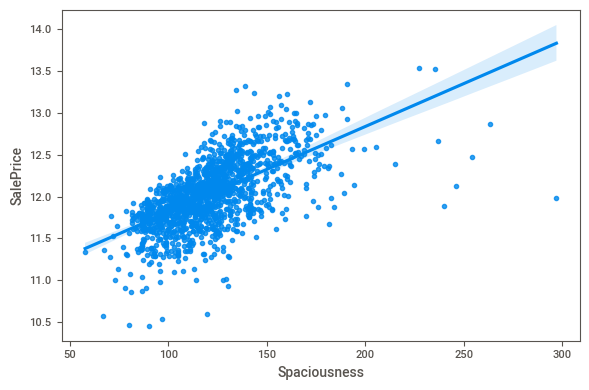

In [348]:
sns.regplot(data=train_mod, x='Spaciousness', y='SalePrice');

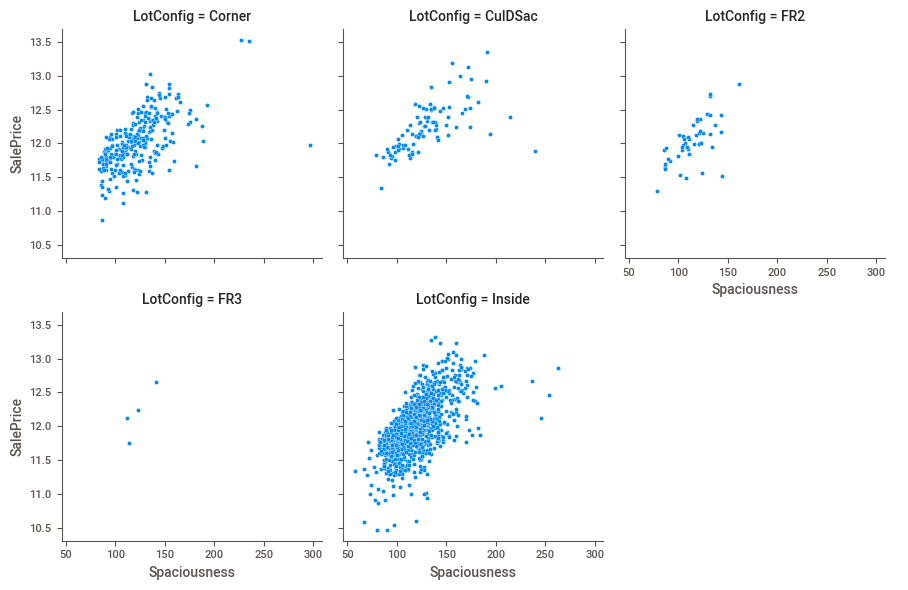

In [349]:
g=sns.FacetGrid(data=train_mod,col='LotConfig',col_wrap=3)
g.map(sns.scatterplot,'Spaciousness','SalePrice')
g.add_legend();

##### TotalOutsideSF
La gente podría tener en consideración que tan grande es la parte exterior de la casa, en nuestros datos esto podría calcularse como la suma de `WoodDeckSF`, `OpenPorchSF`, `EnclosedPorch`, `3Ssnporch` y `ScreenPorch`. Veamos primero la correlación de estas variables con la variable objetivo.

In [350]:
train_mod[['WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea']].corrwith(objetivo)

WoodDeckSF       0.334135
OpenPorchSF      0.321053
EnclosedPorch   -0.149050
3SsnPorch        0.054900
ScreenPorch      0.121208
PoolArea         0.069798
dtype: float64

Analicemos sus gráficas:

La correlación entre TotalOutsideSF y la variable objetivo es de 0.39099302035958355


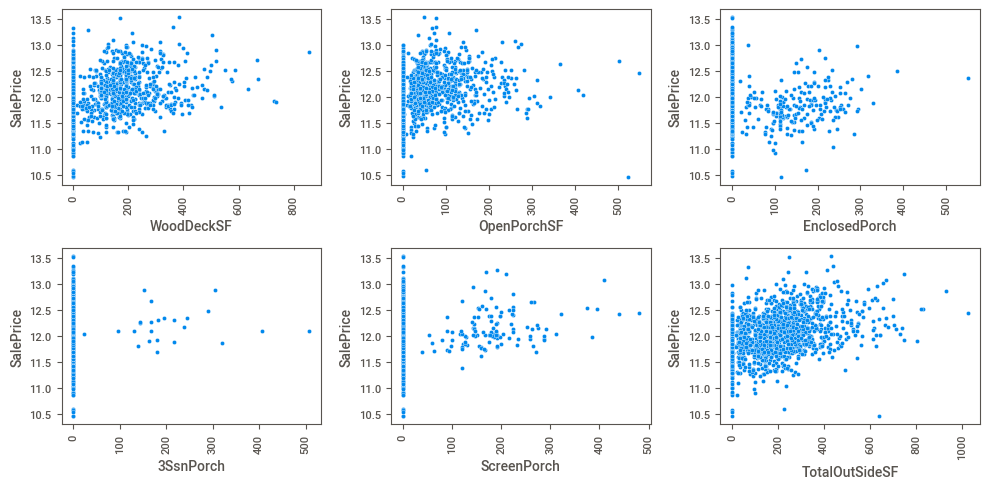

In [351]:
def agregar_totaloutsidesf(dataframe):
    df=dataframe.copy()
    df['TotalOutSideSF'] = df[['WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',\
                               'ScreenPorch']].sum(axis=1)
    return df
train_mod=agregar_totaloutsidesf(train_mod)

print(f'La correlación entre TotalOutsideSF y la variable objetivo es de {objetivo.apply(np.exp).corr(train_mod.TotalOutSideSF)}')

fig, ax= plt.subplots(2,3,figsize=(10,5))
for variable, subplot in zip(['WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','TotalOutSideSF'], ax.flatten()):
    sns.scatterplot(x=train_mod[variable],y=train_mod['SalePrice'],ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)
#ax.flatten()[5].set_visible(False)

Tiene sentido que las correlaciones sean bajas, pues la mayoría de las casas no tienen EnclosedPorchOverallQual. Veamos nuevamente los valores arrojados por la información mutua:

In [356]:
lista_carac = ['TotalOutSideSF','WoodDeckSF','OpenPorchSF','EnclosedPorch',\
               '3SsnPorch','ScreenPorch']

dict(zip(lista_carac,list(mutual_info_regression(train_mod[lista_carac],train_mod['SalePrice']))))

{'TotalOutSideSF': 0.12337727013780775,
 'WoodDeckSF': 0.09743139440885606,
 'OpenPorchSF': 0.15997057376184465,
 'EnclosedPorch': 0.023447704327459684,
 '3SsnPorch': 0.0,
 'ScreenPorch': 0.021075637921396995}

#### 2.4.2 Relaciones ocultas con variables poco relacionadas
En el curso se observó que hay una relación oculta entre BldgType y GrLivArea. Visualicémosla para cerciorarnos de estas relaciones.

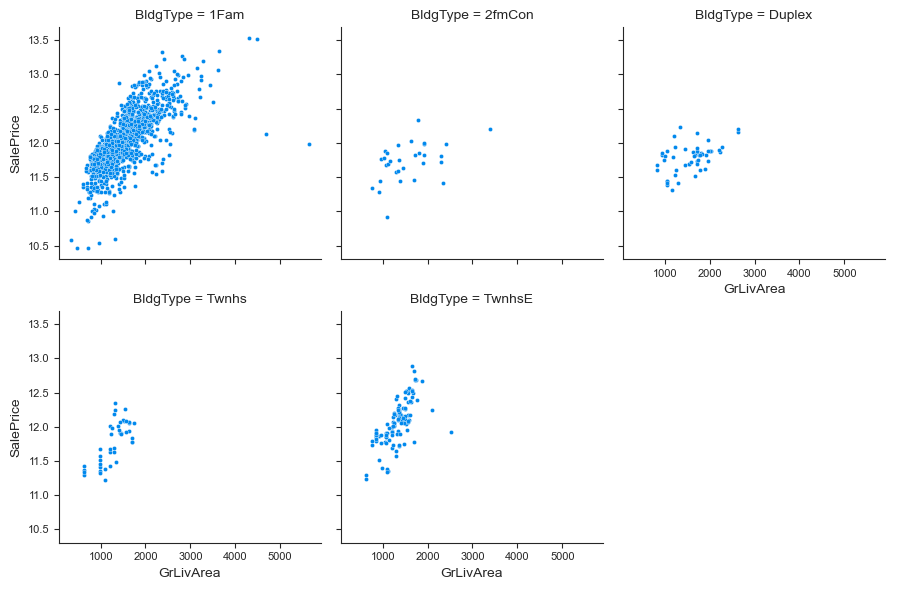

In [280]:
g=sns.FacetGrid(data=train_mod,col='BldgType',col_wrap=3)
g.map(sns.scatterplot,'GrLivArea','SalePrice')
g.add_legend();

Cuando suceden estos casos, creamos los dummies para la variable categórica y las multiplicamos una a una por la variable continua.

In [434]:
def agregar_rel_cat_num(dataframe,cat_feat,num_feat,prefijo):
    df=dataframe.copy()
    aux=pd.get_dummies(df[cat_feat], prefix=prefijo)
    aux=aux.mul(df[num_feat],axis=0)
    try:
        df=df.join(aux)
    except:
        columnas=list(aux.columns)
        df[columnas]=aux
    return df

agregar_rel_bldgtype_grlivarea = lambda df: agregar_rel_cat_num(df,'BldgType', \
                                                                'GrLivArea','BT-GLA')

#train_mod=agregar_rel_bldgtype_grlivarea(train_mod)

Analicemos sus correlaciones y su información mutua con respecto a la variable objetivo.

In [405]:
aux_carac=['BT-GLA_1Fam', 'BT-GLA_2fmCon', 'BT-GLA_Duplex', 'BT-GLA_Twnhs','BT-GLA_TwnhsE','GrLivArea','BldgType_factor']
train_mod['BldgType_factor'], _=train_mod.BldgType.factorize()
train_mod['BldgType_factor']=train_mod['BldgType_factor'].astype('int64')
print('Información mutua')
print(pd.Series(dict(zip(aux_carac,list(mutual_info_regression(train_mod[aux_carac],
                                                               objetivo))))))
print('Correlaciones')
print(train_mod[aux_carac].corrwith(objetivo))

Información mutua
BT-GLA_1Fam        0.448840
BT-GLA_2fmCon      0.005850
BT-GLA_Duplex      0.028632
BT-GLA_Twnhs       0.026344
BT-GLA_TwnhsE      0.055480
GrLivArea          0.458063
BldgType_factor    0.042382
dtype: float64
Correlaciones
BT-GLA_1Fam        0.549670
BT-GLA_2fmCon     -0.086608
BT-GLA_Duplex     -0.099067
BT-GLA_Twnhs      -0.083719
BT-GLA_TwnhsE      0.059822
GrLivArea          0.700927
BldgType_factor   -0.105163
dtype: float64


Parece que la única que nos servirá es BT-GLA_1Fam, si la comparamos con GrLivArea. Veamos que sucede si le hacemos PCA a las nuevas 5 columnas creadas

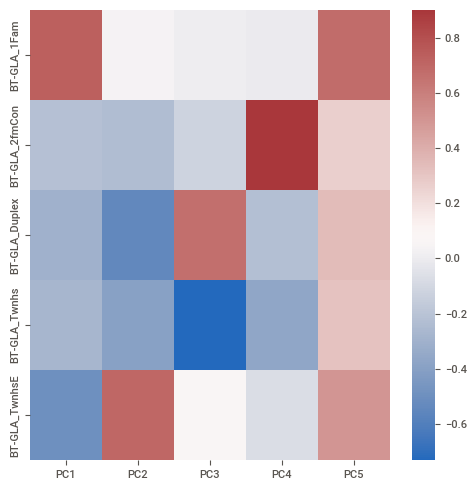

In [388]:
aux_carac=['BT-GLA_1Fam', 'BT-GLA_2fmCon', 'BT-GLA_Duplex', 'BT-GLA_Twnhs','BT-GLA_TwnhsE']
pca,aux_pca, aux_loadings=apply_pca(train_mod[aux_carac])
fig, ax = plt.subplots(figsize=(5,5)) 
sns.heatmap(aux_loadings,cmap="vlag", ax=ax);

Aunque sería interesante análizar qué significa cada componente, no lo escribiré aquí. Por otro lado, miremos qué nos dicen las gráficas de estas componentes con respecto a la variable objetivo.

[0.5124064399913566, 0.5139855911416795, 0.3537856467718403, 0.3964420884845965, 0.3835072670674755]


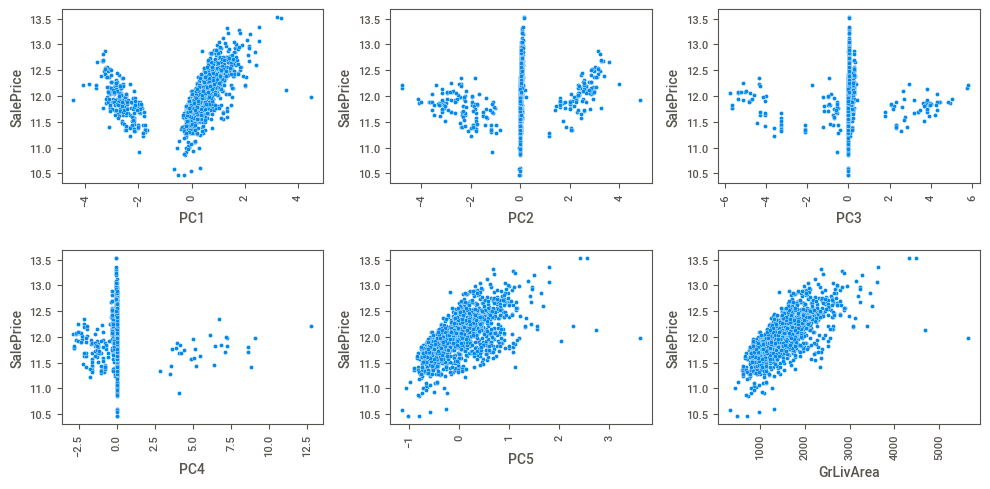

In [396]:
fig, ax= plt.subplots(2,3,figsize=(10,5))
for variable, subplot in zip(['PC1','PC2','PC3','PC4','PC5','GrLivArea'], ax.flatten()):
    if subplot == ax.flatten()[5]:
        sns.scatterplot(x=train_mod['GrLivArea'],y=objetivo,ax=subplot)
    else:
        sns.scatterplot(x=aux_pca[variable],y=objetivo,ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)
print(list(mutual_info_regression(aux_pca[['PC1','PC2','PC3','PC4','PC5']],train_mod['SalePrice'])))

Es muy interesante la forma como PCA hace más claras las relaciones mostrándonos los contrastes entre las variables. Por ejemplo PC1 nos muestra un contraste entre las áreas de las casa tipo 1Fam y el resto (de igual manera que para PC2,PC3 y PC4). PC5 es interesante, pues pareciera que muestra lo que tienen en común todos los tipos de edificio con rescpecto al área habitable sobre tierra.

#### 2.4.3 Conteo de características asociadas
Muchas veces hay varios tipos de características que cuentan como tipos diferentes. Podemos contarlas para crear una nueva variable. El curso nos recomendaba creala para las asociadas con `Porch`.

0       0
1       1
2       0
3       0
4       1
       ..
1455    0
1456    1
1457    0
1458    1
1459    1
Name: WoodDeckSF, Length: 1460, dtype: int64

0.43801206307877644

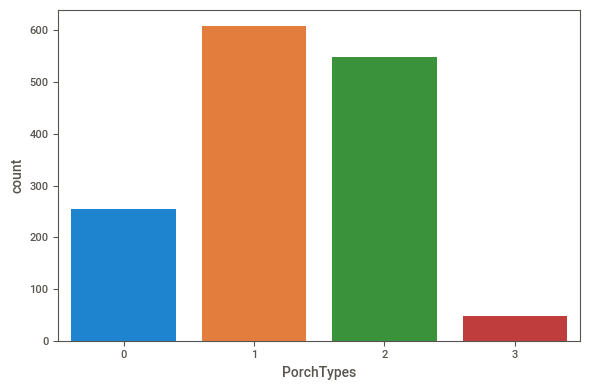

In [421]:
def agregar_conteo_porch(dataframe):
    df=dataframe.copy()
    
    df['PorchTypes'] = (df.WoodDeckSF>0).astype('int64') + (df.OpenPorchSF > 0).astype('int64')\
                    +(df.EnclosedPorch >0).astype('int64') + (df['3SsnPorch']>0).astype('int64')\
                    +(df.ScreenPorch > 0).astype('int64')
    return df

train_mod=agregar_conteo_porch(train_mod)

sns.countplot(data=train_mod,x='PorchTypes')
train_mod.PorchTypes.corr(objetivo)

#### 2.4.4 Transformaciones agrupadas de características
El valor de una casa depende frecuentemente de cómo se le compara con las casas usuales en su vecindario. En el curso se creó `MedNhbdArea`, que describe la mediana de GrLivArea agrupada por Neighborhood.

In [425]:
def agregar_mednhbdarea(dataframe):
    df=dataframe.copy()
    df['MedNhbdArea']=df.groupby('Neighborhood').GrLivArea.transform('median')
    return df

train_mod=agregar_mednhbdarea(train_mod)
train_mod.MedNhbdArea.corr(objetivo)

0.6468742372422881

#### 2.4.5 Agrupaciones de características con KMeans
Se recomienda siempre hacer agrupaciones para características relacionadas con el espacio y la proximidad. En este caso tenemos por ejemplo varias características relacionadas al área.
'LotArea','TotalBsmtSF','FirstFlrSF','SecondFlrSF' y 'GrLivArea'.

In [444]:
def agregar_agrupacion_kmeans(dataframe, carac=list()\
                              ,add_cluster=True, cluster_name='Cluster'\
                              ,add_centroid_dists = True,centroid_name='Centroid'\
                              ,n_clusters=10, n_init=10,random_state=0):
    if carac==list():
        return dataframe
    df=dataframe.copy()
    # Standardize
    X_scaled = df.loc[:, carac]
    X_scaled = (X_scaled - X_scaled.mean(axis=0)) / X_scaled.std(axis=0)
    kmeans = KMeans(n_clusters=n_clusters, n_init=n_init, random_state=random_state)
    if add_cluster:
        df[cluster_name] = kmeans.fit_predict(X_scaled)
        df["Cluster"] = df.Cluster.astype("category")
    #Agreguemos también las distancias a cada cluster
    if add_centroid_dists:
        aux=kmeans.fit_transform(X_scaled)
        aux=pd.DataFrame(aux,columns=[f'Centroide{i}' for i in range(aux.shape[1])])
        try:
            train_mod=train_mod.join(aux)
        except:
            df[[f'Centroide{i}' for i in range(aux.shape[1])]]=aux
    return df
carac = ['LotArea','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea']
train_mod=agregar_agrupacion_kmeans(train_mod, carac=carac)

D:\DataScience\Spacial_titanic_project\env\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
D:\DataScience\Spacial_titanic_project\env\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


#### 2.4.6 PCA
Probaremos con las siguientes características: "GarageArea", "YearRemodAdd", "TotalBsmtSF", "GrLivArea".

In [441]:
carac=["GarageArea", 'YearRemodAdd', "TotalBsmtSF", "GrLivArea"]
pca,aux_pca, loadings=apply_pca(train_mod[carac])
loadings

,PC1,PC2,PC3,PC4
GarageArea,0.542671,0.055849,0.172729,-0.820094
YearRemodAdd,0.418537,-0.883023,-0.052628,0.205735
TotalBsmtSF,0.518308,0.324224,0.617357,0.495082
GrLivArea,0.511558,0.334709,-0.765680,0.200032


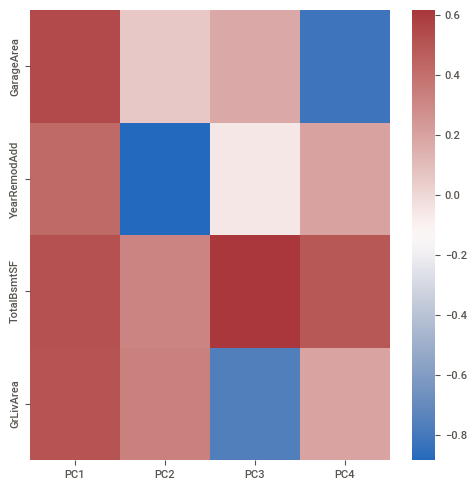

In [439]:
fig, ax = plt.subplots(figsize=(5,5)) 
sns.heatmap(loadings,cmap="vlag", ax=ax);

La primer componente muestra una relación positiva entre todas las características, por lo que probablemente tenga que ver con el tamaño de las casas en años recientes. En particualr podría interpretarse como las casas con años de remodelación grandes (es decir, más recientes) que tienen una tamaño bastante parejo entre su área sobre la tierra, el sótano y el garaje. La tercera componente podría mostrar un contraste entre las casas con espacios habitables amplios, pero con sótanos pequeños y viceversa. De la misma forma PC4 podría mostrar una comparación relacionada con casas recientemente remodeladas que tienen sótanos grandes y áreas habitables sobre tierra relativamente grandes, pero con garajes pequeños y viceversa. 
Veamos una gráfica de cada una de las componentes vs el precio de venta:

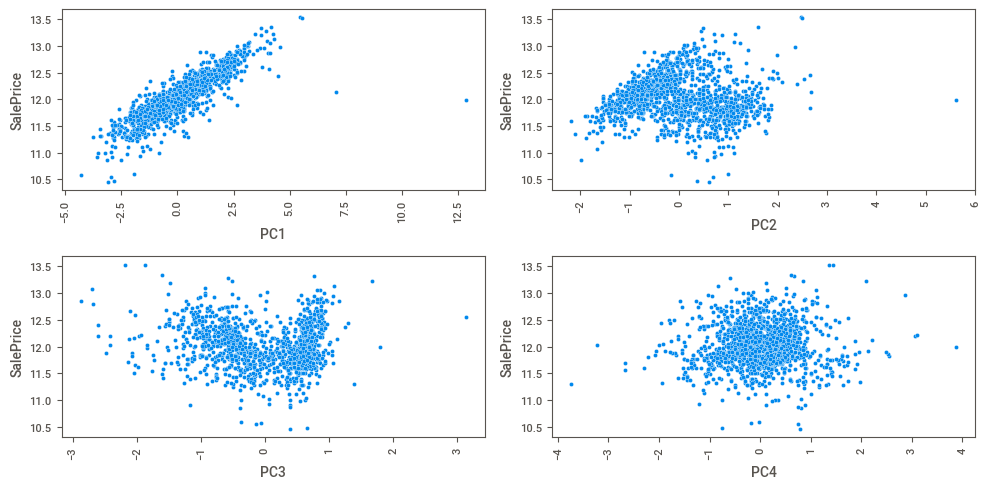

In [445]:
fig, ax= plt.subplots(2,2,figsize=(10,5))
for variable, subplot in zip(['PC1','PC2','PC3','PC4'], ax.flatten()):
    sns.scatterplot(x=aux_pca[variable],y=objetivo,ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)

In [446]:
aux_carac=[f'PC{i}' for i in range(1,5)]

print('Información mutua')
print(pd.Series(dict(zip(aux_carac,list(mutual_info_regression(aux_pca[aux_carac],
                                                               objetivo))))))
print('Correlaciones')
print(aux_pca[aux_carac].corrwith(objetivo))

Información mutua
PC1    0.824514
PC2    0.226038
PC3    0.161457
PC4    0.042829
dtype: float64
Correlaciones
PC1    0.854651
PC2   -0.034418
PC3   -0.102902
PC4    0.036597
dtype: float64


En cualquier caso, vamos a agregar las 4 componentes obtenidas

In [448]:
def agregar_pca(dataframe, carac=[]):
    if carac==[]:
        warnings.warn('No se agregó ninguna característica para el análisis.')
        return dataframe
    df=dataframe.copy()
    _,aux_pca,_=apply_pca(df[carac])
    try:
        df=df.join(aux_pca)
    except:
        columnas=list(aux_pca.columns)
        df[columnas]=aux_pca
        warnings.warn('Las columnas PCi ya existían en el dataframe y fueron reemplazadas.')
    return df

carac=["GarageArea", 'YearRemodAdd', "TotalBsmtSF", "GrLivArea"]
train_mod=agregar_pca(train_mod,carac)

### 2.5 Modelo

Nuevamente probaremos con CatBoost.

In [470]:
def posicion_categoricas(dataframe):
    col_df = (pd.DataFrame(dataframe.dtypes, columns=["DataType"])\
            .rename_axis("Column")\
            .reset_index()\
            .rename_axis("Position"))
    return list(col_df[col_df['DataType'] == 'category'].index)

#### 2.5.1 Experimentos
Probaremos algunas variaciones de las recomendaciones. Por ejemplo, ¿dará mejores resultados aplicar todas las sugerencias de antes, bastará con una sola y en ese caso cuál es la mejor, o será mejor alguna combinación entre las sugerencias?. Para comenzar, reiniciemos los datos:

In [471]:
train_mod=train_clean.copy()
test_mod=test_clean.copy()

#### 2.5.2 Agreguemos todas las sugerencias
Como siempre, trabajaremos con Pipelines porque me parece la manera más ordenada de trabajar (por el momento)

In [510]:
# Convertimos las funciones de la sección anterior para poderlas usar en la pipeline

carac_kmeans = ['LotArea','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea']
carac_pca=["GarageArea", 'YearRemodAdd', "TotalBsmtSF", "GrLivArea"]

llr_transformer=FunctionTransformer(agregar_livlotratio)
spac_transformer=FunctionTransformer(agregar_spaciousness)
toutsides_transformer=FunctionTransformer(agregar_totaloutsidesf)
rbt_grl_transformer=FunctionTransformer(agregar_rel_bldgtype_grlivarea)
conteo_porch_transformer=FunctionTransformer(agregar_conteo_porch)
mednhba_transformer=FunctionTransformer(agregar_mednhbdarea)
kmeans_transformer=FunctionTransformer(agregar_agrupacion_kmeans, kw_args={'carac':carac_kmeans})
pca_transformer=FunctionTransformer(agregar_pca, kw_args={'carac':carac_pca})
sugerencias=make_pipeline(llr_transformer,
                    spac_transformer,
                    toutsides_transformer,
                    rbt_grl_transformer,
                    conteo_porch_transformer,
                    mednhba_transformer,
                    kmeans_transformer,
                    pca_transformer,
                    
                   )

X=train_mod.copy()
X=sugerencias.fit_transform(X)
y=X.pop('SalePrice')

D:\DataScience\Spacial_titanic_project\env\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
D:\DataScience\Spacial_titanic_project\env\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


Evaluemos ahora el modelo usando validación cruzada

In [509]:
# Creamos el objeto tipo Pool
from catboost import Pool

carac_categoricas_cb=posicion_categoricas(X)

train_pool = Pool(data=X, label=y, cat_features=carac_categoricas_cb, has_header=True)

params_catboost={'verbose':False, 
                'iterations':1000, 
                'cat_features':carac_categoricas_cb, 
                'eval_metric':'RMSE',
                'loss_function':'RMSE',
                'learning_rate':0.015}


from sklearn.model_selection import ShuffleSplit
shuffle_split = ShuffleSplit(n_splits=5, test_size=.25, random_state=0)
cv_data = cv(
    params = params_catboost,
    pool = train_pool,
    verbose = False,
    folds = shuffle_split,
    plot=True
)


#booster = CatBoost(params_catboost)
#booster.fit(X_train,y_train, eval_set=(X_valid,y_valid))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.214243234
bestIteration = 999

Training on fold [1/5]

bestTest = 0.202754336
bestIteration = 997

Training on fold [2/5]

bestTest = 0.2363659668
bestIteration = 999

Training on fold [3/5]

bestTest = 0.216176761
bestIteration = 998

Training on fold [4/5]

bestTest = 0.1746409536
bestIteration = 998



In [517]:
 print(f"En general, el rendimiento del modelo, usando la métrica RMSE, es de {cv_data['test-RMSE-mean'].min()}.")

En general, el rendimiento del modelo, usando la métrica RMSE, es de 0.20885225528122014.


Es un poco alto, en comparación a las primeras entregas que hicimos. De hecho, este experimento se hizo anteriormente y se entregó la solución en Kaggle, sin antes hacer la validación cruzada. Los resultados fueron los siguientes y concuerdan con lo obtenido en el análisis anterior.

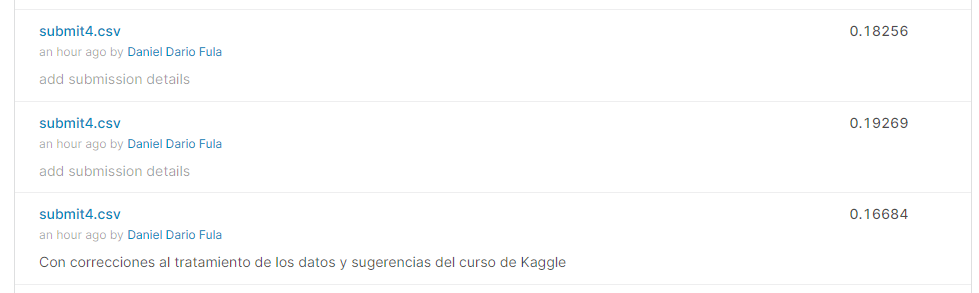

#### 2.5.3 Agreguemos solo el análisis de PCA

In [538]:
sugerencia_pca=make_pipeline(#llr_transformer,
                    #spac_transformer,
                    #toutsides_transformer,
                    #rbt_grl_transformer,
                    #conteo_porch_transformer,
                    #mednhba_transformer,
                    #kmeans_transformer,
                    pca_transformer,
                   )
X=train_mod.copy()
X=sugerencia_pca.fit_transform(X)
y=X.pop('SalePrice')

In [520]:
# Creamos el objeto tipo Pool
from catboost import Pool

carac_categoricas_cb=posicion_categoricas(X)

train_pool = Pool(data=X, label=y, cat_features=carac_categoricas_cb, has_header=True)

params_catboost={'verbose':False, 
                'iterations':3000, 
                'cat_features':carac_categoricas_cb, 
                'eval_metric':'RMSE',
                'loss_function':'RMSE',
                'learning_rate':0.005}


from sklearn.model_selection import ShuffleSplit
shuffle_split = ShuffleSplit(n_splits=5, test_size=.2, random_state=0)
cv_data = cv(
    params = params_catboost,
    pool = train_pool,
    verbose = False,
    folds = shuffle_split,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.1961534407
bestIteration = 2999

Training on fold [1/5]

bestTest = 0.1617506886
bestIteration = 2999

Training on fold [2/5]

bestTest = 0.1847361771
bestIteration = 2998

Training on fold [3/5]

bestTest = 0.1863773277
bestIteration = 2999

Training on fold [4/5]

bestTest = 0.1675511283
bestIteration = 2999



In [521]:
print(f"En general, el rendimiento del modelo, usando la métrica RMSE, es de {cv_data['test-RMSE-mean'].min()}.")

En general, el rendimiento del modelo, usando la métrica RMSE, es de 0.17931385664018454.


Sin lugar a dudas tiene un mejor rendimiento que usando todas las sugerencias. Quizá al usar todas las sugerencias estamos haciendo sobreajuste en algunas características.
Anteriormente se entrenó el modelo al que solo se le agregaron las componentes principales (Pero cambiando el dato del año de remodelación por el del año de construcción) y sin hacer validación cruzada y se obtuvieron mejores resultados:

* Con 1000 iteraciones y una tasa de aprendizaje de 0.01
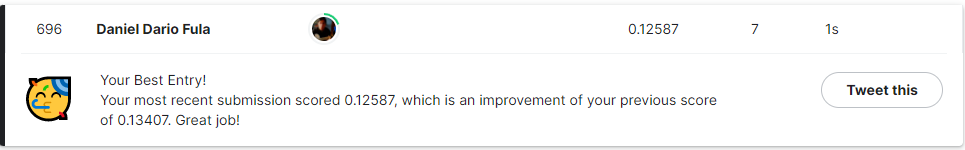
* Con 3000 iteraciones y una tasa de aprendizaje de 0.005
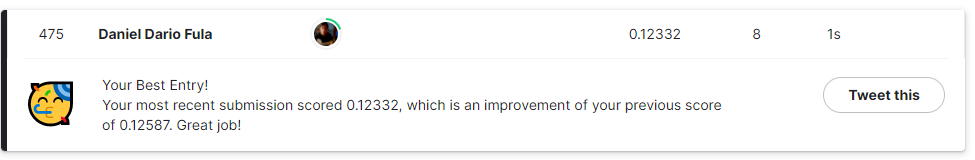


In [530]:
params_catboost={'verbose':False, 
                'iterations':3000, 
                'cat_features':carac_categoricas_cb, 
                'eval_metric':'RMSE',
                'loss_function':'RMSE',
                'learning_rate':0.01}
from sklearn.model_selection import KFold
split = KFold(n_splits=5, shuffle=True, random_state=0)
cv_data = cv(
    params = params_catboost,
    pool = train_pool,
    verbose = False,
    plot=True,
    folds = split
)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.210812875
bestIteration = 2999

Training on fold [1/5]

bestTest = 0.1322727002
bestIteration = 2985

Training on fold [2/5]

bestTest = 0.197782288
bestIteration = 2999

Training on fold [3/5]

bestTest = 0.1870761292
bestIteration = 2999

Training on fold [4/5]

bestTest = 0.1762057029
bestIteration = 2998



#### Entrega 4

In [534]:
booster_submit = CatBoost({'verbose':100, 
                    'iterations':3000, 
                    'cat_features':carac_categoricas_cb, 
                    'eval_metric':'RMSE',
                    'loss_function':'RMSE',
                    'learning_rate':0.005})
booster_submit.fit(X,y)

0:	learn: 0.3980389	total: 36ms	remaining: 1m 47s
100:	learn: 0.2927701	total: 4.47s	remaining: 2m 8s
200:	learn: 0.2284900	total: 9.77s	remaining: 2m 16s
300:	learn: 0.1876687	total: 17.8s	remaining: 2m 39s
400:	learn: 0.1617948	total: 24.6s	remaining: 2m 39s
500:	learn: 0.1455654	total: 30.1s	remaining: 2m 29s
600:	learn: 0.1342205	total: 35.3s	remaining: 2m 21s
700:	learn: 0.1260356	total: 40.7s	remaining: 2m 13s
800:	learn: 0.1201447	total: 45.8s	remaining: 2m 5s
900:	learn: 0.1155294	total: 51s	remaining: 1m 58s
1000:	learn: 0.1116218	total: 56.3s	remaining: 1m 52s
1100:	learn: 0.1084891	total: 1m 1s	remaining: 1m 45s
1200:	learn: 0.1058356	total: 1m 6s	remaining: 1m 39s
1300:	learn: 0.1034560	total: 1m 11s	remaining: 1m 33s
1400:	learn: 0.1012576	total: 1m 16s	remaining: 1m 27s
1500:	learn: 0.0993044	total: 1m 21s	remaining: 1m 21s
1600:	learn: 0.0977166	total: 1m 26s	remaining: 1m 15s
1700:	learn: 0.0960049	total: 1m 31s	remaining: 1m 9s
1800:	learn: 0.0946708	total: 1m 36s	rema

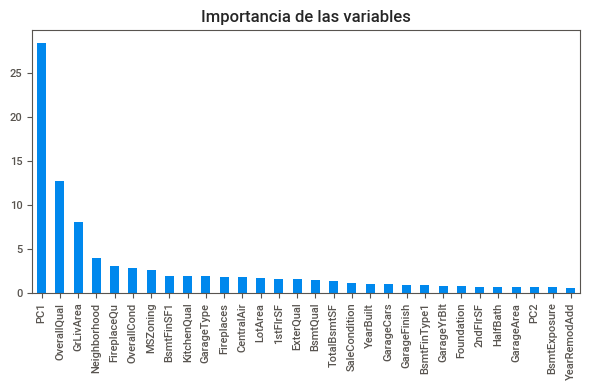

In [537]:
fi=booster_submit.feature_importances_
features_dict = dict(zip(X.columns, list(fi)))
features_df = pd.DataFrame(features_dict, index=[0]).T.sort_values(by=[0], ascending=False).head(30).T
features_df.T.plot.bar(title="Importancia de las variables", legend=False);

In [539]:
df=pd.DataFrame()
df['Id']=test_mod['Id'].astype('int64')

df['SalePrice']=pd.DataFrame(booster_submit.predict(sugerencia_pca.transform(test_mod)),columns=['SalePrice']).apply(np.exp)
df.to_csv('submit4.csv', index=False)

##### Resultado

El resultado de esta entrega fue el siguiente :0.1259
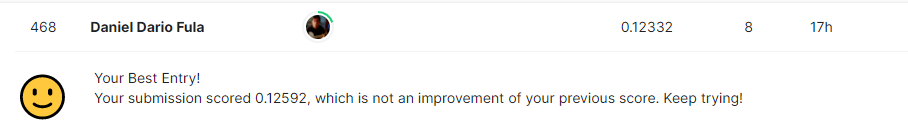